# ----------------------------------------------------**Audio Denoising Project**--------------------------------------------------
Abdel-Hakim ARAB

 # Introduction


<!-- ## Introduction: Audio Denoising with Deep Learning   -->

This project explores deep learning approaches for **audio denoising** using both **spectrogram-based** and **waveform-based** methods :

1. **Spectrogram U-Net** [A. Jansson et al., ISMIR 2017](https://arxiv.org/abs/1710.11402)  
   - Operates in the **frequency domain** with **U-Net convolutional networks** to isolate clean signals via **magnitude masking**.  

2. **Wave-U-Net** [D. Stoller et al., ISMIR 2018](https://arxiv.org/abs/1806.03185)  
   - Processes **raw waveforms** in the **time domain** using **multi-scale convolutional blocks** for **end-to-end separation**.  

3. **TaSNet** [ICASSP 2018](https://arxiv.org/abs/1809.07454) and [IEEE/ACM 2019](https://ieeexplore.ieee.org/document/8683855)  
   - Focuses on **real-time time-domain separation** with **adaptive masking** surpassing ideal time-frequency masking.  

<!-- ### Evaluation Metrics:   -->
<!-- - **PESQ** (Speech Quality) and **STOI** (Intelligibility) are used to assess performance on **noisy-clean pairs**.   -->

<!-- This work compares these methods, highlighting their strengths and limitations for **audio denoising tasks**. -->


# Imports

In [ ]:
!pip install pystoi
!pip install pesq


  Preparing metadata (setup.py) ... done
  Created wheel for pesq: filename=pesq-0.0.4-cp310-cp310-linux_x86_64.whl size=262944 sha256=8b0cbaa247d8b0c0ef36362fedce8af52565a5c3a363d12d0efa1c7535bad98a
  Stored in directory: /root/.cache/pip/wheels/c5/4e/2c/251524370c0fdd659e99639a0fbd0ca5a782c3aafcd456b28d
Successfully built pesq


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import zipfile
import time
import random
import librosa
import scipy
from IPython.core.display import display
import IPython.display as ipd
from tqdm import tqdm
from scipy.io import wavfile
import soundfile as sf
from pathlib import Path
import pystoi
from pystoi.stoi import stoi
from pesq import pesq
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
import shutil
import psutil
from scipy.signal import wiener, butter, lfilter, filtfilt
from tqdm import tqdm

In [ ]:
data_path = '/kaggle/input/audio-denoising-data/'
noisy_path = data_path + 'denoising_data/'
xtrain_path = noisy_path + 'train/'
xtest_path = noisy_path + 'test/'
xsample_path = noisy_path + 'train_small/'

origin_path = data_path + 'voice_origin/'
ytrain_path = origin_path + 'train/'
ytest_path = origin_path + 'test/'
ysample_path = origin_path + 'train_small/'

In [ ]:
print(len(os.listdir(xtrain_path)))
print(len(os.listdir(ytrain_path)))
print(len(os.listdir(xtest_path)))
print(len(os.listdir(xtest_path)))

2118
2118
782
782


 # Data Visualization

In [ ]:
# See a sample from the samples set

noisy_files = [f for f in os.listdir(xsample_path) if f.lower().endswith('.wav')]
clean_files = [f for f in os.listdir(ysample_path) if f.lower().endswith('.wav')]

print(f"Noisy folder: {xsample_path}")
print(f"Original folder: {ysample_path}")
print(f"Noisy files found: {len(noisy_files)}")
print(f"Original files found: {len(clean_files)}")

common_files = list(set(noisy_files).intersection(clean_files))
print(f"Common files: {len(common_files)}")

# Pick matching file at random
sample_file = random.choice(common_files)
print("Sample file chosen:", sample_file)

noisy_file_path = os.path.join(xsample_path, sample_file)
clean_file_path = os.path.join(ysample_path, sample_file)

fs_noisy, sig_noisy = wavfile.read(noisy_file_path)
fs_clean, sig_clean = wavfile.read(clean_file_path)


print("noisy signal:", sample_file)
display(ipd.Audio(data=sig_noisy, rate=fs_noisy))

print("Original signal:", sample_file)
display(ipd.Audio(data=sig_clean, rate=fs_clean))


print("Noisy length:", sig_noisy.shape, "samples")
print("Original length:", sig_clean.shape, "samples")
print("Sampling rates :", fs_noisy, fs_clean)


print("Original signal amplitude is within : [",np.max(sig_clean), ",", np.min(sig_clean),"]" )
print("Noisy signal amplitude is within : [",np.max(sig_noisy), ",", np.min(sig_noisy),"]" )


Noisy folder: /kaggle/input/audio-denoising-data/denoising_data/train_small/
Original folder: /kaggle/input/audio-denoising-data/voice_origin/train_small/
Noisy files found: 10
Original files found: 10
Common files: 10
Sample file chosen: Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_0_.wav
noisy signal: Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_0_.wav


Original signal: Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_0_.wav


Noisy length: (80000,) samples
Original length: (40000,) samples
Sampling rates : 8000 4000
Original signal amplitude is within : [ 14477 , -15300 ]
Noisy signal amplitude is within : [ 0.4308611 , -0.50117946 ]


* For the samples of small_train, we can see that the original and noisy data dont have the same samplling rate and length
* We can see also that we have a mono channel audio
* The amplitude interval is different between original and noisy signal, so we need normalization

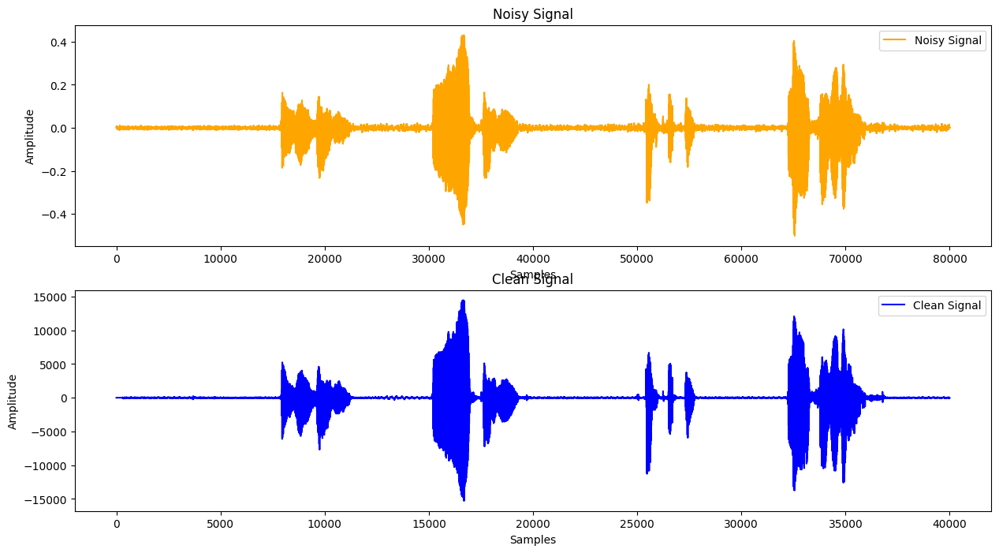

In [ ]:
# Plot the waveforms
plt.figure(figsize=(15, 8))

plt.subplot(2, 1, 1)
plt.plot(sig_noisy, color='orange', label='Noisy Signal')
plt.title("Noisy Signal")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(sig_clean, color='blue', label='Clean Signal')
plt.title("Clean Signal")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.legend()


In [ ]:

def check_audio_files(
    root_path,
    expected_fs=8000,
    expected_length=80000
):


    wav_paths = list(Path(root_path).rglob("*.wav"))
    print(f"Found {len(wav_paths)} WAV files under {root_path}")

    valid_files = []
    invalid_files = []
    for wav_path in wav_paths:
        sr, data = None, None
        try:
            data, sr = sf.read(wav_path)  # shape: (num_samples,) for mono
        except Exception as e:
            invalid_files.append((wav_path, f"READ_ERROR: {e}"))
            continue

        # Check sample rate
        if sr != expected_fs:
            invalid_files.append((wav_path, f"Wrong sample rate: {sr} != {expected_fs}"))
            continue

        # Check length
        if len(data) != expected_length:
            invalid_files.append((wav_path, f"Wrong length: {len(data)} != {expected_length}"))
            continue

        valid_files.append((wav_path, data, sr))


    print(f"Valid files:   {len(valid_files)}")
    print(f"Invalid files: {len(invalid_files)}")

    # Log the invalid ones
    if invalid_files:
        print("\nInvalid files details:")
        for fpath, reason in invalid_files:
            print(f" - {fpath} | {reason}")



root_path = "/kaggle/input/audio-denoising-data/"
check_audio_files(data_path, expected_fs=8000, expected_length=80000)


Found 5820 WAV files under /kaggle/input/audio-denoising-data/
Valid files:   5810
Invalid files: 10

Invalid files details:
 - /kaggle/input/audio-denoising-data/voice_origin/train_small/Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_7_.wav | Wrong sample rate: 4000 != 8000
 - /kaggle/input/audio-denoising-data/voice_origin/train_small/Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_0_.wav | Wrong sample rate: 4000 != 8000
 - /kaggle/input/audio-denoising-data/voice_origin/train_small/Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_8_.wav | Wrong sample rate: 4000 != 8000
 - /kaggle/input/audio-denoising-data/voice_origin/train_small/Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_2_.wav | Wrong sample rate: 4000 != 8000
 - /kaggle/input/audio-denoising-data/voice_origin/train_small/Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_5_.wav | Wrong sample rate: 4000 != 8000
 - /kaggle/input/audio-denoising-data/voice_origin/train_small/Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_6_.wav | W

* So as we see, only tran_small data that its origianl version doesnt match the sample rate and length of the noisy version.
* So for training and testing, we have all the audios with length of 80000, and a sample rate of 8000.

In [ ]:
def normalize_signal(signal, method='peak'):

    float_signal = signal.astype(np.float32)
    if method == 'peak':
        max_val = np.max(np.abs(float_signal))
        if max_val < 1e-8:
            # Avoid div by zero if it's near-silent
            return float_signal
        return float_signal / max_val
    elif method == 'rms':
        rms = np.sqrt(np.mean(float_signal**2))
        if rms < 1e-8:
            return float_signal
        return float_signal / rms
    else:
        raise ValueError(f"Unknown method '{method}'. Choose 'peak' or 'rms'.")


Sample file chosen: Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap04_36_.wav


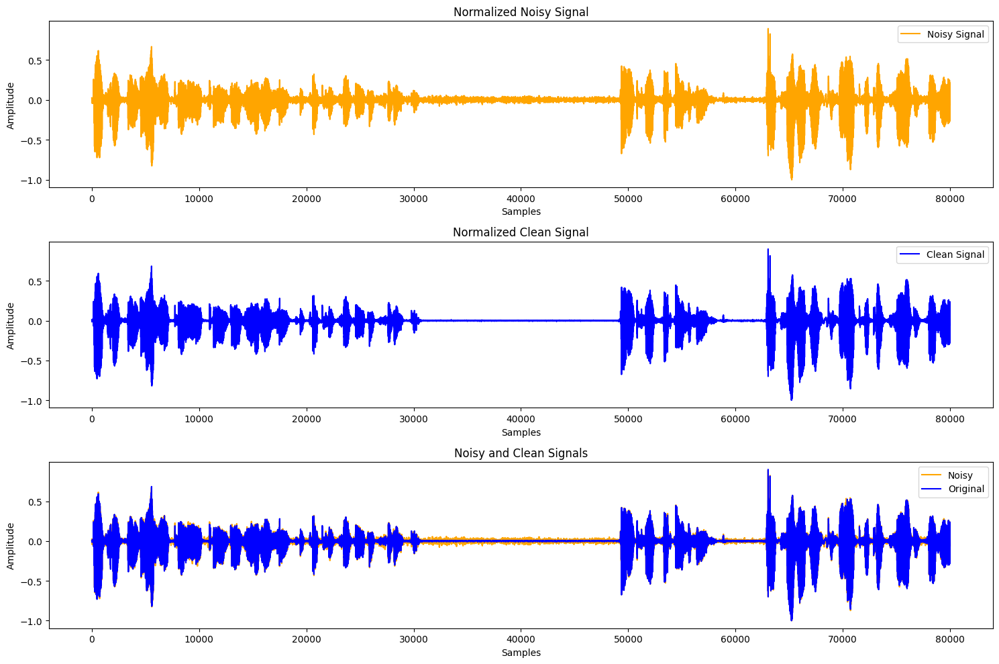

noisy signal norm: Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap04_36_.wav


Original signal norm: Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap04_36_.wav


noisy signal: Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap04_36_.wav


Original signal: Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap04_36_.wav


In [ ]:
noisy_files = [f for f in os.listdir(xtrain_path) if f.lower().endswith('.wav')]
clean_files = [f for f in os.listdir(ytrain_path) if f.lower().endswith('.wav')]
common_files = list(set(noisy_files).intersection(clean_files))
sample_file = random.choice(common_files)
print("Sample file chosen:", sample_file)
noisy_file_path = os.path.join(xtrain_path, sample_file)
clean_file_path = os.path.join(ytrain_path, sample_file)
fs_noisy, sig_noisy = wavfile.read(noisy_file_path)
fs_clean, sig_clean = wavfile.read(clean_file_path)

sig_noisy_norm = normalize_signal(sig_noisy, method='peak')
sig_clean_norm = normalize_signal(sig_clean, method='peak')

plt.figure(figsize=(15, 10))

plt.subplot(3, 1, 1)
plt.plot(sig_noisy_norm, color='orange', label='Noisy Signal')
plt.title("Normalized Noisy Signal")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(sig_clean_norm, color='blue', label='Clean Signal')
plt.title("Normalized Clean Signal")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(sig_noisy_norm, color='orange', label='Noisy')
plt.plot(sig_clean_norm, color='blue', label='Original')
plt.title("Noisy and Clean Signals")
plt.xlabel("Samples")
plt.ylabel("Amplitude")
plt.legend()

plt.tight_layout()
plt.show()

print("noisy signal norm:", sample_file)
display(ipd.Audio(data=sig_noisy_norm, rate=fs_noisy))

print("Original signal norm:", sample_file)
display(ipd.Audio(data=sig_clean_norm, rate=fs_clean))

print("noisy signal:", sample_file)
display(ipd.Audio(data=sig_noisy, rate=fs_noisy))

print("Original signal:", sample_file)
display(ipd.Audio(data=sig_clean, rate=fs_clean))


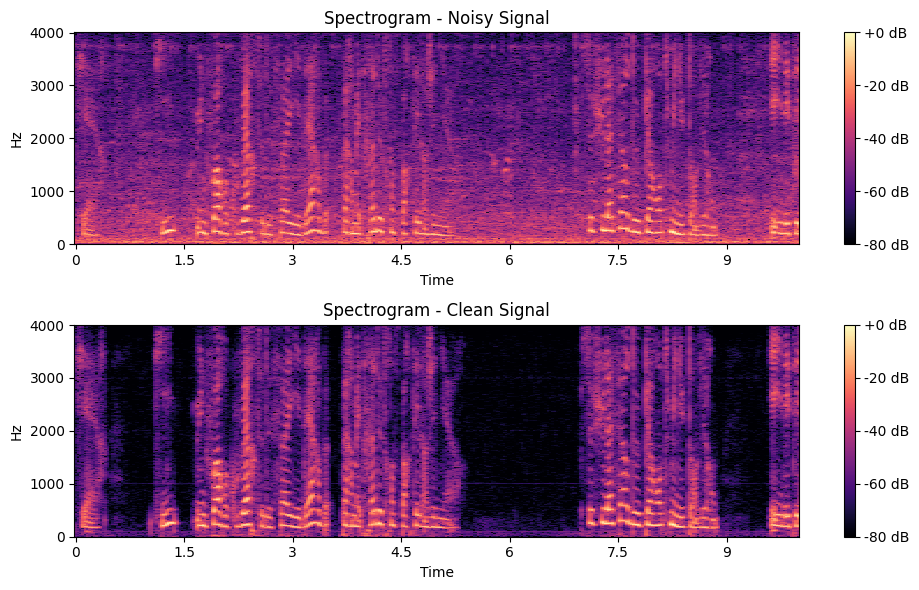

In [ ]:
# Short-Time Fourier Transform
noisy_stft = librosa.stft(sig_noisy_norm, n_fft=1024, hop_length=256)
clean_stft = librosa.stft(sig_clean_norm, n_fft=1024, hop_length=256)

noisy_db = librosa.amplitude_to_db(np.abs(noisy_stft), ref=np.max)
clean_db = librosa.amplitude_to_db(np.abs(clean_stft), ref=np.max)

# Plot the spectrograms
plt.figure(figsize=(10, 6))
plt.subplot(2, 1, 1)
librosa.display.specshow(noisy_db, sr=fs_noisy, hop_length=256, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram - Noisy Signal')
plt.subplot(2, 1, 2)
librosa.display.specshow(clean_db, sr=fs_clean, hop_length=256, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram - Clean Signal')

plt.tight_layout()
plt.show()


In [ ]:
def sdr(ref, est, eps=1e-8):
    return 10 * np.log10(np.sum(ref ** 2) / (np.sum((ref - est) ** 2) + eps))


def si_snr(ref, est, eps=1e-8):
    ref = ref - np.mean(ref)
    est = est - np.mean(est)
    alpha = np.sum(ref * est) / (np.sum(ref ** 2) + eps)
    proj = alpha * ref
    noise = est - proj
    return 10 * np.log10(np.sum(proj ** 2) / (np.sum(noise ** 2) + eps))


## Metrics

* **PESQ** :
- Perceived audio quality.
- scores from -0.5 to 4.5.

* **STOI** :
- intelligibility of speech signals by analyzing short-time spectral - correlations .
- Score between 0 and 1

# Dumb/Classic methods

In [ ]:
def wiener_filter(mixed_signal, mysize=15):

    denoised_signal = wiener(mixed_signal, mysize=mysize)

    return denoised_signal



In [ ]:
def butterworth_filter(mixed_signal, cutoff_freq=2000, fs=8000, order=4, btype='low'):

    nyquist_freq = 0.5 * fs
    normal_cutoff = cutoff_freq / nyquist_freq
    b, a = butter(order, normal_cutoff, btype=btype, analog=False)
    denoised_signal = lfilter(b, a, mixed_signal)

    return denoised_signal


## Evaluation

In [ ]:
def compute_metrics_baseline(clean, noisy, denoised, fs):

    pesq_noisy = pesq(fs, clean, noisy, 'nb')
    pesq_denoised = pesq(fs, clean, denoised, 'nb')

    stoi_noisy = stoi(clean, noisy, fs)
    stoi_denoised = stoi(clean, denoised, fs)

    si_snr_noisy = si_snr(clean, noisy)
    si_snr_denoised = si_snr(clean, denoised)

    sdr_noisy = sdr(clean, noisy)
    sdr_denoised = sdr(clean, denoised)

    # Store results
    metrics = {
        'PESQ': (pesq_noisy, pesq_denoised),
        'STOI': (stoi_noisy, stoi_denoised),
        'SI-SNR': (si_snr_noisy, si_snr_denoised),
        'SDR': (sdr_noisy, sdr_denoised)
    }
    return metrics


In [ ]:
def evaluate_baseline(filter_func, noisy_dir, clean_dir, fs, **filter_params):

    metrics = {'PESQ': [], 'STOI': [], 'SI-SNR': [], 'SDR': []}

    for filename in tqdm(os.listdir(noisy_dir)):
        if filename.endswith('.wav'):
            fs_n, noisy = wavfile.read(os.path.join(noisy_dir, filename))
            fs_c, clean = wavfile.read(os.path.join(clean_dir, filename))

            assert fs_n == fs_c == fs, "Sampling rates dont match"

            noisy = noisy / np.max(np.abs(noisy))
            clean = clean / np.max(np.abs(clean))
            denoised = filter_func(noisy, **filter_params)

            result = compute_metrics_baseline(clean, noisy, denoised, fs)
            for key in metrics.keys():
                metrics[key].append(result[key])

    avg_metrics = {k: (np.mean(v[0]), np.mean(v[1])) for k, v in metrics.items()}
    return avg_metrics


## Denoising

In [ ]:
print("Evaluating Wiener Filter...")
wiener_metrics = evaluate_baseline(
    wiener_filter,
    xtest_path,
    ytest_path,
    fs=8000,
    # mysize=10
)

print("\nWiener Filter Metrics:")
print(wiener_metrics)


Evaluating Wiener Filter...


100%|██████████| 782/782 [06:59<00:00,  1.86it/s]


Wiener Filter Metrics:
{'PESQ': (2.181869864463806, 2.061996638774872), 'STOI': (0.8639095848977094, 0.8629206564581366), 'SI-SNR': (14.695622615288968, 10.552642006065682), 'SDR': (14.304117443351743, 10.761528574488244)}


  0%|          | 0/782 [00:00<?, ?it/s]


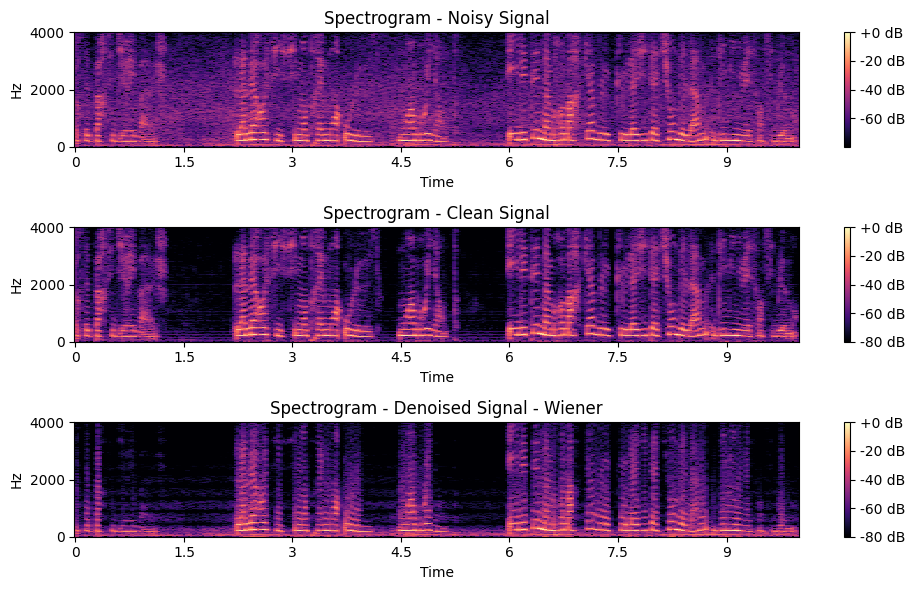

In [ ]:
for filename in tqdm(os.listdir(xtest_path)):
        if filename.endswith('.wav'):
            fs_n, noisy = wavfile.read(os.path.join(xtest_path, filename))
            fs_c, clean = wavfile.read(os.path.join(ytest_path, filename))

            assert fs_n == fs_c == 8000, "Sampling rates dont match"

            noisy = noisy / np.max(np.abs(noisy))
            clean = clean / np.max(np.abs(clean))
            denoised = wiener_filter(noisy, 18)
            break


# STFT
noisy_stft = librosa.stft(noisy, n_fft=1024, hop_length=256)
clean_stft = librosa.stft(clean, n_fft=1024, hop_length=256)
denoised_stft = librosa.stft(denoised, n_fft=1024, hop_length=256)

noisy_db = librosa.amplitude_to_db(np.abs(noisy_stft), ref=np.max)
clean_db = librosa.amplitude_to_db(np.abs(clean_stft), ref=np.max)
denoised_db = librosa.amplitude_to_db(np.abs(denoised_stft), ref=np.max)

# spectrograms
plt.figure(figsize=(10, 6))
plt.subplot(3, 1, 1)
librosa.display.specshow(noisy_db, sr=8000, hop_length=256, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram - Noisy Signal')
plt.subplot(3, 1, 2)
librosa.display.specshow(clean_db, sr=8000, hop_length=256, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram - Clean Signal')
plt.subplot(3, 1, 3)
librosa.display.specshow(denoised_db, sr=8000, hop_length=256, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram - Denoised Signal - Wiener')

plt.tight_layout()
plt.show()


In [ ]:
print("Evaluating Butterworth Filter...")
butter_metrics = evaluate_baseline(
    butterworth_filter,
    xtest_path,
    ytest_path,
    fs=8000,
    cutoff_freq=2500,
    order=4,
    btype='low'
)

print("\nButterworth Filter Metrics:")
print(butter_metrics)


Evaluating Butterworth Filter...


100%|██████████| 782/782 [06:49<00:00,  1.91it/s]


Butterworth Filter Metrics:
{'PESQ': (2.494982600212097, 2.354310154914856), 'STOI': (0.9520356380482555, 0.944888867578656), 'SI-SNR': (14.003922611787042, 10.22463562488382), 'SDR': (14.200925638547115, 10.494398691705623)}


  0%|          | 0/782 [00:00<?, ?it/s]


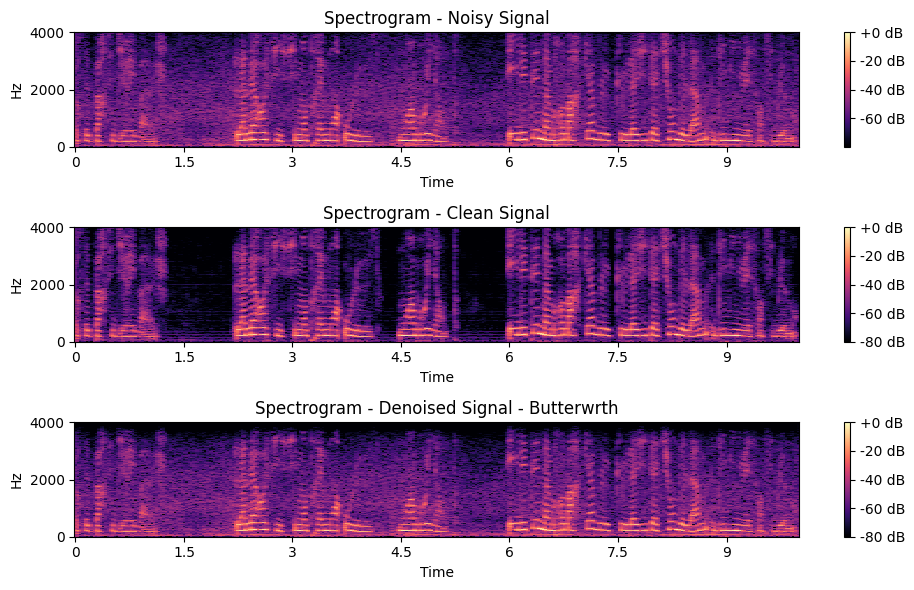

In [ ]:
for filename in tqdm(os.listdir(xtest_path)):
        if filename.endswith('.wav'):
            fs_n, noisy = wavfile.read(os.path.join(xtest_path, filename))
            fs_c, clean = wavfile.read(os.path.join(ytest_path, filename))

            assert fs_n == fs_c == 8000, "Sampling rates dont match"

            noisy = noisy / np.max(np.abs(noisy))
            clean = clean / np.max(np.abs(clean))
            denoised2 = butterworth_filter(noisy,cutoff_freq=2000,order=2,btype='low')
            break


# STFT
noisy_stft = librosa.stft(noisy, n_fft=1024, hop_length=256)
clean_stft = librosa.stft(clean, n_fft=1024, hop_length=256)
denoised2_stft = librosa.stft(denoised2, n_fft=1024, hop_length=256)
noisy_db = librosa.amplitude_to_db(np.abs(noisy_stft), ref=np.max)
clean_db = librosa.amplitude_to_db(np.abs(clean_stft), ref=np.max)
denoised2_db = librosa.amplitude_to_db(np.abs(denoised2_stft), ref=np.max)

# Spectrograms
plt.figure(figsize=(10, 6))
plt.subplot(3, 1, 1)
librosa.display.specshow(noisy_db, sr=8000, hop_length=256, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram - Noisy Signal')
plt.subplot(3, 1, 2)
librosa.display.specshow(clean_db, sr=8000, hop_length=256, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram - Clean Signal')
plt.subplot(3, 1, 3)
librosa.display.specshow(denoised2_db, sr=8000, hop_length=256, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram - Denoised Signal - Butterwrth')

plt.tight_layout()
plt.show()

# Spectrogramme U-Net

## Idea

![Deep U-Net audio source separation architecture](https://camo.githubusercontent.com/ee525acc2add2198749036bf76ea627b9972f881ee844099cb301f9745b843ba/68747470733a2f2f706963342e7a68696d672e636f6d2f76322d38646638636164316466343765346134626537363533373831353636333335325f31323030783530302e6a7067)


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


## Model

In [ ]:

class SpectrogramUNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1):
        super(SpectrogramUNet, self).__init__()

        # Encoder
        self.enc1 = self.conv_block(in_channels, 16)   # 512x512 -> 512x512
        self.enc2 = self.conv_block(16, 32)           # 512x512 -> 256x256
        self.enc3 = self.conv_block(32, 64)           # 256x256 -> 128x128
        self.enc4 = self.conv_block(64, 128)          # 128x128 -> 64x64
        self.enc5 = self.conv_block(128, 256)         # 64x64 -> 32x32
        self.enc6 = self.conv_block(256, 512)         # 32x32 -> 16x16

        # Decoder
        self.dec1 = self.deconv_block(512, 256)       # 16x16 -> 32x32
        self.dec2 = self.deconv_block(512, 128)       # 32x32 -> 64x64
        self.dec3 = self.deconv_block(256, 64)        # 64x64 -> 128x128
        self.dec4 = self.deconv_block(128, 32)        # 128x128 -> 256x256
        self.dec5 = self.deconv_block(64, 16)         # 256x256 -> 512x512

        # Final Output Layer
        self.final = nn.Conv2d(32, out_channels, kernel_size=1)  # 512x512 -> 512x512

    def conv_block(self, in_channels, out_channels):
        """Convolutional block with ReLU"""
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def deconv_block(self, in_channels, out_channels):
        """Deconvolutional block with ReLU"""
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        # Encoder Path
        e1 = self.enc1(x)
        e2 = self.enc2(F.max_pool2d(e1, 2))
        e3 = self.enc3(F.max_pool2d(e2, 2))
        e4 = self.enc4(F.max_pool2d(e3, 2))
        e5 = self.enc5(F.max_pool2d(e4, 2))
        e6 = self.enc6(F.max_pool2d(e5, 2))

        # Decoder Path
        d1 = self.dec1(e6)
        d1 = torch.cat([d1, e5], dim=1)  # Concat with skip connection

        d2 = self.dec2(d1)
        d2 = torch.cat([d2, e4], dim=1)

        d3 = self.dec3(d2)
        d3 = torch.cat([d3, e3], dim=1)

        d4 = self.dec4(d3)
        d4 = torch.cat([d4, e2], dim=1)

        d5 = self.dec5(d4)
        d5 = torch.cat([d5, e1], dim=1)


        # Final output

        out = self.final(d5)
        out = torch.sigmoid(out)

        return x * out


In [ ]:
dummy = torch.rand([4, 1, 512, 512])
model = SpectrogramUNet()
y = model(dummy)

## Preprocessing

In [ ]:

def pad_to_size(tensor, target_size):
    _, _, h, w = tensor.shape
    pad_h = target_size[0] - h
    pad_w = target_size[1] - w
    return nn.functional.pad(tensor, (0, pad_w, 0, pad_h))

class AudioDenoisingDataset(Dataset):
    def __init__(self, noisy_files, clean_files, target_size=(512, 512)):
        self.noisy_files = noisy_files
        self.clean_files = clean_files
        self.target_size = target_size

    def __len__(self):
        return len(self.noisy_files)

    def __getitem__(self, idx):
        fs_noisy, noisy = wavfile.read(self.noisy_files[idx])
        fs_clean, clean = wavfile.read(self.clean_files[idx])

        # Normalize
        noisy = normalize_signal(noisy, method='peak')
        clean = normalize_signal(clean, method='peak')
        # spectrograms
        noisy_stft = librosa.stft(noisy, n_fft=1024, hop_length=256)
        clean_stft = librosa.stft(clean, n_fft=1024, hop_length=256)
        # Magnitudes
        noisy_mag = np.abs(noisy_stft)
        clean_mag = np.abs(clean_stft)

        noisy_mag = torch.tensor(noisy_mag, dtype=torch.float32).unsqueeze(0)
        clean_mag = torch.tensor(clean_mag, dtype=torch.float32).unsqueeze(0)
        noisy_mag = pad_to_size(noisy_mag.unsqueeze(0), self.target_size).squeeze(0)
        clean_mag = pad_to_size(clean_mag.unsqueeze(0), self.target_size).squeeze(0)

        return noisy_mag, clean_mag


In [ ]:
def eval_pesq_stoi(model, loader, fs=8000):
    model.eval()
    total_pesq, total_stoi = 0.0, 0.0
    num_samples = 0

    with torch.no_grad():
        for noisy_mag, clean_mag in loader:
            noisy_mag, clean_mag = noisy_mag.to(device), clean_mag.to(device)
            pred_mag = model(noisy_mag)

            for i in range(clean_mag.shape[0]):
                pred_mag_np = pred_mag[i].squeeze(0).cpu().numpy()
                clean_mag_np = clean_mag[i].squeeze(0).cpu().numpy()
                noisy_mag_np = noisy_mag[i].squeeze(0).cpu().numpy()

                noisy_stft = librosa.stft(
                    normalize_signal(noisy_mag_np), n_fft=1024, hop_length=256
                )
                noisy_phase = np.angle(noisy_stft)

                if noisy_phase.ndim == 3:
                    noisy_phase = noisy_phase[:, :, 0]

                if noisy_phase.shape != pred_mag_np.shape:
                    noisy_phase = noisy_phase[: pred_mag_np.shape[0], : pred_mag_np.shape[1]]

                # Reconstruct waveforms
                pred_complex = pred_mag_np * np.exp(1j * noisy_phase)
                clean_complex = clean_mag_np * np.exp(1j * noisy_phase)

                pred_waveform = librosa.istft(pred_complex, hop_length=256)
                clean_waveform = librosa.istft(clean_complex, hop_length=256)

                # Normalize signals
                pred_waveform = normalize_signal(pred_waveform, method = 'peak')
                clean_waveform = normalize_signal(clean_waveform, method = 'peak')

                # Evaluate PESQ and STOI
                try:
                    pesq_score = pesq(fs, clean_waveform, pred_waveform, mode='nb')
                except:
                    pesq_score = 0

                stoi_score = stoi(clean_waveform, pred_waveform, fs)

                total_pesq += pesq_score
                total_stoi += stoi_score
                num_samples += 1

    # Averages
    avg_pesq = total_pesq / num_samples
    avg_stoi = total_stoi / num_samples

    return avg_pesq, avg_stoi


In [ ]:
noisy_files = [os.path.join(xtrain_path, f) for f in os.listdir(xtrain_path) if f.endswith('.wav')]
clean_files = [os.path.join(ytrain_path, f) for f in os.listdir(ytrain_path) if f.endswith('.wav')]


In [ ]:
model = UNet(in_channels=1, out_channels=1).to(device)
model = SpectrogramUNet(in_channels=1, out_channels=1).to(device)
criterion = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=4e-3)

# Training and Validation Split
train_size = int(0.85 * len(noisy_files))
val_size = len(noisy_files) - train_size

train_noisy = noisy_files[:train_size]
val_noisy = noisy_files[train_size:]

train_clean = clean_files[:train_size]
val_clean = clean_files[train_size:]

train_dataset = AudioDenoisingDataset(train_noisy, train_clean, target_size=(512, 512))
val_dataset = AudioDenoisingDataset(val_noisy, val_clean, target_size=(512, 512))

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)



In [ ]:
print(device)

cuda


## Training

In [ ]:
num_epochs = 30
train_losses, val_losses = [], []
val_pesq, val_stoi = [], []

for epoch in range(num_epochs):
    # Training Loop
    model.train()
    train_loss = 0.0
    for noisy_mag, clean_mag in train_loader:
        noisy_mag, clean_mag = noisy_mag.to(device), clean_mag.to(device)

        optimizer.zero_grad()
        # print(noisy_mag.shape)
        output = model(noisy_mag)
        loss = criterion(output, clean_mag)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()

    train_losses.append(train_loss / len(train_loader))

    # Validation Loop
    model.eval()
    val_loss = 0.0
    for noisy_mag, clean_mag in val_loader:
        noisy_mag, clean_mag = noisy_mag.to(device), clean_mag.to(device)
        output = model(noisy_mag)
        loss = criterion(output, clean_mag)
        val_loss += loss.item()

    val_losses.append(val_loss / len(val_loader))

    # Evaluation
    pesq_score, stoi_score = eval_pesq_stoi(model, val_loader)
    val_pesq.append(pesq_score)
    val_stoi.append(stoi_score)

    print(f"Epoch {epoch+1}: Train Loss = {train_losses[-1]:.4f}, Val Loss = {val_losses[-1]:.4f}, PESQ = {pesq_score:.3f}, STOI = {stoi_score:.3f}")
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "/kaggle/working/unet_spectro_best_model.pth")
        print(f"Saved Best Model at Epoch {epoch+1}")


/usr/local/lib/python3.10/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=1024 is too large for input signal of length=512
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/librosa/core/spectrum.py:266: UserWarning: n_fft=1024 is too large for input signal of length=512
  warnings.warn(


Epoch 1: Train Loss = 0.2432, Val Loss = 0.1675, PESQ = 2.798, STOI = 0.887
Saved Best Model at Epoch 1
Epoch 2: Train Loss = 0.1165, Val Loss = 0.1028, PESQ = 3.298, STOI = 0.905
Saved Best Model at Epoch 2
Epoch 3: Train Loss = 0.1111, Val Loss = 0.1017, PESQ = 3.211, STOI = 0.906
Saved Best Model at Epoch 3
Epoch 4: Train Loss = 0.1099, Val Loss = 0.1027, PESQ = 3.335, STOI = 0.903
Epoch 5: Train Loss = 0.1100, Val Loss = 0.0966, PESQ = 3.289, STOI = 0.904
Saved Best Model at Epoch 5
Epoch 6: Train Loss = 0.1042, Val Loss = 0.0974, PESQ = 3.159, STOI = 0.908
Epoch 7: Train Loss = 0.1062, Val Loss = 0.0964, PESQ = 3.320, STOI = 0.907
Saved Best Model at Epoch 7
Epoch 8: Train Loss = 0.1047, Val Loss = 0.0935, PESQ = 3.226, STOI = 0.909
Saved Best Model at Epoch 8
Epoch 9: Train Loss = 0.1032, Val Loss = 0.0921, PESQ = 3.296, STOI = 0.910
Saved Best Model at Epoch 9
Epoch 10: Train Loss = 0.1024, Val Loss = 0.0916, PESQ = 3.343, STOI = 0.908
Saved Best Model at Epoch 10
Epoch 11: Trai

In [ ]:
# Load the saved best model
best_model = SpectrogramUNet(in_channels=1, out_channels=1).to(device)
best_model.load_state_dict(torch.load("/kaggle/working/unet_spectro_best_model.pth"))
best_model.eval()
print("Best model loaded successfully.")


Best model loaded successfully.


<ipython-input-212-c4ea343ffe75>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model.load_state_dict(torch.load("/kaggle/working/unet_spectro_best_model.pth"))


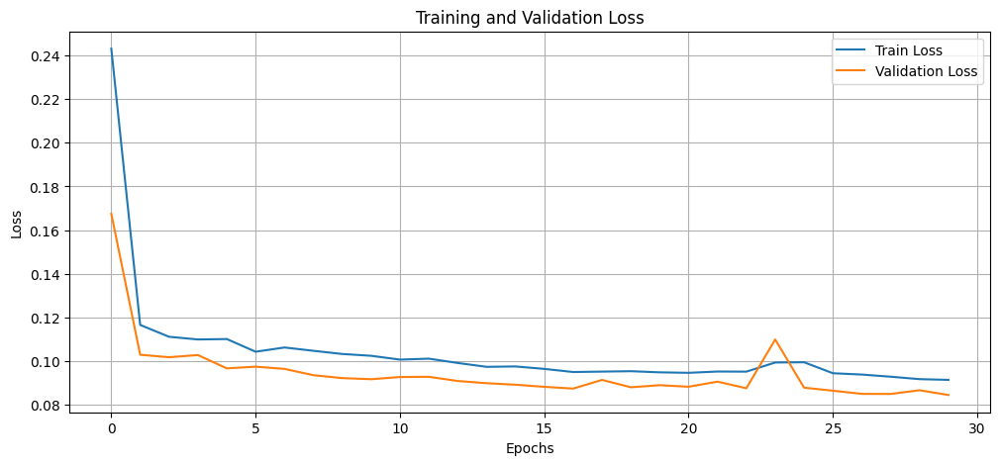

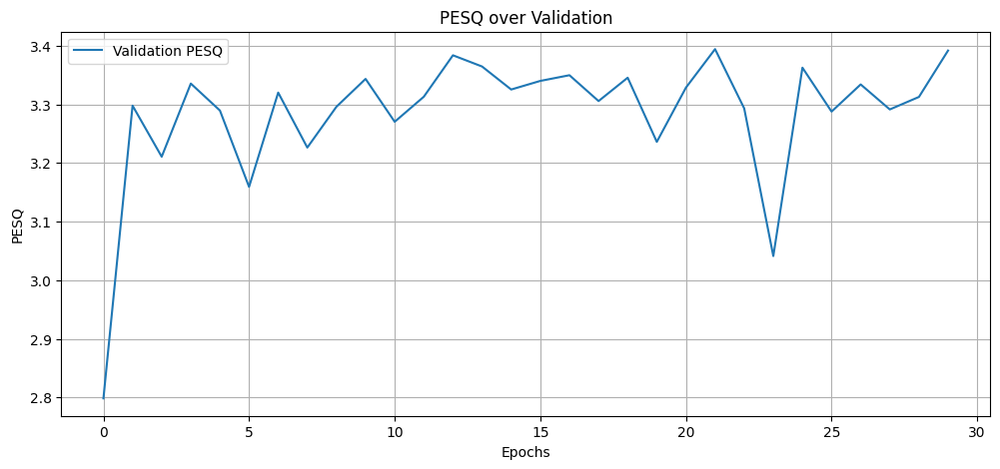

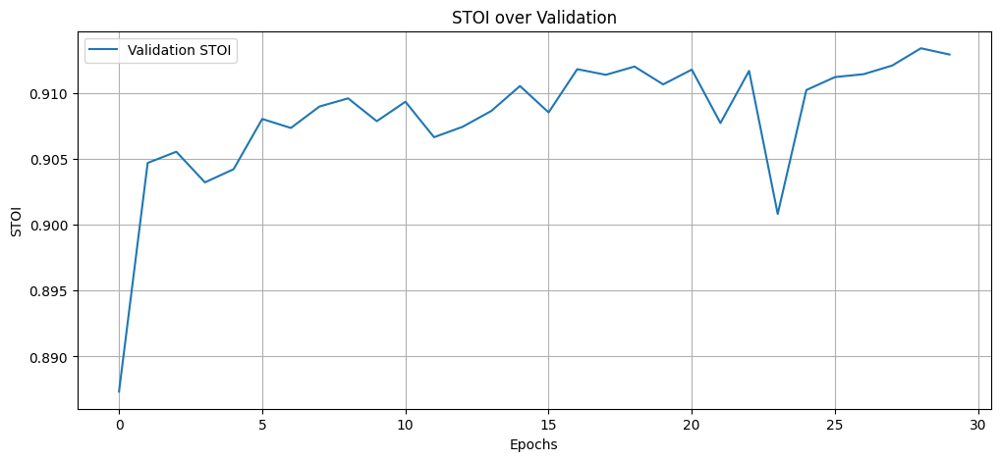

In [ ]:

plt.figure(figsize=(12, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(val_pesq, label='Validation PESQ')
plt.xlabel('Epochs')
plt.ylabel('PESQ')
plt.title('PESQ over Validation')
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(12, 5))
plt.plot(val_stoi, label='Validation STOI')
plt.xlabel('Epochs')
plt.ylabel('STOI')
plt.title('STOI over Validation')
plt.legend()
plt.grid()
plt.show()


## Evaluation on test

In [ ]:
# Test dataset paths
test_noisy_files = [os.path.join(xtest_path, f) for f in os.listdir(xtest_path) if f.endswith('.wav')]
test_clean_files = [os.path.join(ytest_path, f) for f in os.listdir(ytest_path) if f.endswith('.wav')]

# Create Test Dataset and DataLoader
test_dataset = AudioDenoisingDataset(test_noisy_files, test_clean_files, target_size=(512, 512))
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)


In [ ]:
model = SpectrogramUNet(in_channels=1, out_channels=1).to(device)
model.load_state_dict(torch.load("/kaggle/working/unet_spectro_best_model.pth"))
# model.load_state_dict(torch.load("/kaggle/working/unet_spectro_best_model.pth"))
model.eval()

pesq_score, stoi_score = eval_pesq_stoi(model, test_loader)

print(f"Test PESQ: {pesq_score:.4f}")
print(f"Test STOI: {stoi_score:.4f}")


<ipython-input-215-d519c0b80c0b>:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/kaggle/working/unet_spectro_best_model.pth"))


Test PESQ: 3.3883
Test STOI: 0.9143


In [ ]:
noisy_mag, clean_mag = test_dataset[0]  # First sample
noisy_mag = noisy_mag.unsqueeze(0).to(device)

# Predict
with torch.no_grad():
    pred_mag = model(noisy_mag).squeeze(0).cpu().numpy()
    noisy_mag_np = noisy_mag.squeeze(0).cpu().numpy()
    clean_mag_np = clean_mag.cpu().numpy()

noisy_stft = librosa.stft(noisy_mag_np.flatten(), n_fft=1024, hop_length=256)
noisy_phase = np.angle(noisy_stft)
# print(noisy_phase.shape, pred_mag[0].shape)
if noisy_phase.shape != pred_mag[0].shape:
    noisy_phase = noisy_phase[:pred_mag[0].shape[0], :pred_mag[0].shape[1]]

# Reconstruct spectrograms
pred_complex = pred_mag[0] * np.exp(1j * noisy_phase)
clean_complex = clean_mag_np[0] * np.exp(1j * noisy_phase)
noisy_complex = noisy_mag_np[0] * np.exp(1j * noisy_phase)

# ISTFT to get waveforms
pred_waveform = librosa.istft(pred_complex, hop_length=256)
clean_waveform = librosa.istft(clean_complex, hop_length=256)
noisy_waveform = librosa.istft(noisy_complex, hop_length=256)





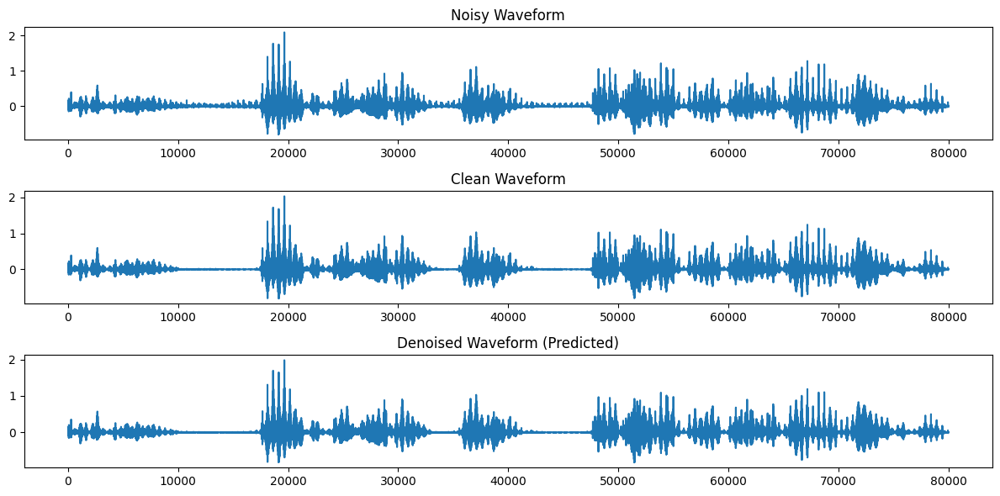

In [ ]:
# Plot Waveforms
plt.figure(figsize=(12, 6))
plt.subplot(3, 1, 1)
plt.plot(noisy_waveform)
plt.title("Noisy Waveform")

plt.subplot(3, 1, 2)
plt.plot(clean_waveform)
plt.title("Clean Waveform")

plt.subplot(3, 1, 3)
plt.plot(pred_waveform)
plt.title("Denoised Waveform (Predicted)")
plt.tight_layout()
plt.show()

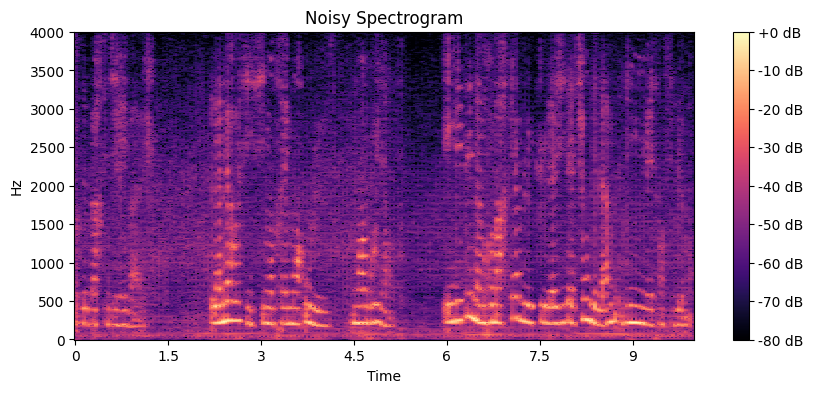

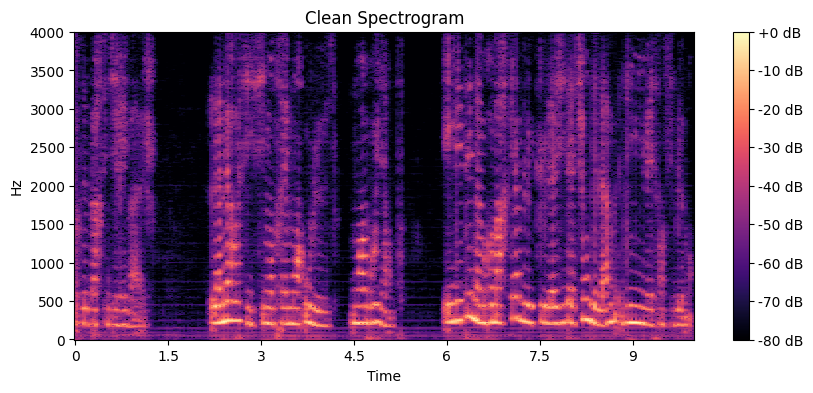

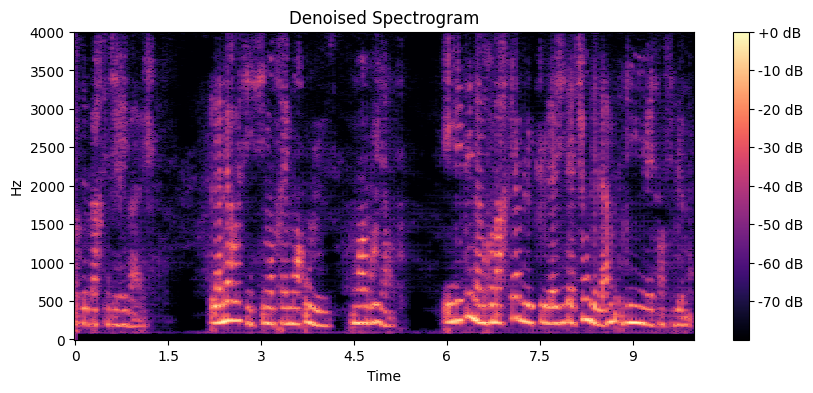

In [ ]:
# plot spectrograms
def plot_spectrogram(signal, title):
    D = librosa.amplitude_to_db(np.abs(librosa.stft(signal, n_fft=1024, hop_length=256)), ref=np.max)
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(D, sr=8000, hop_length=256, x_axis='time', y_axis='hz')
    plt.colorbar(format='%+2.0f dB')
    plt.title(title)
    plt.show()

plot_spectrogram(noisy_waveform, "Noisy Spectrogram")
plot_spectrogram(clean_waveform, "Clean Spectrogram")
plot_spectrogram(pred_waveform, "Denoised Spectrogram")



In [ ]:
# Play audio
import IPython.display as ipd
print("Noisy Audio:")
ipd.display(ipd.Audio(noisy_waveform, rate=8000))

print("Clean Audio:")
ipd.display(ipd.Audio(clean_waveform, rate=8000))

print("Denoised Audio:")
ipd.display(ipd.Audio(pred_waveform, rate=8000))


Noisy Audio:


Clean Audio:


Denoised Audio:


# Wave U-Net

## Idea

![Wave-U-Net architecture](https://raw.githubusercontent.com/f90/Wave-U-Net/master/waveunet.png)


## Model

In [ ]:
class WaveUNet(nn.Module):
    def __init__(self, num_channels=1, base_filters=16, depth=3):

        super().__init__()
        self.depth = depth
        self.base_filters = base_filters

        # --- Encoder (down) Convs ---
        # We define a sequence of convolutions; each will be followed by manual slicing [::2].
        self.encoder = nn.ModuleList()

        in_ch = num_channels
        for layer_i in range(depth):
            out_ch = (layer_i + 1) * base_filters
            block = nn.Sequential(
                nn.Conv1d(in_ch, out_ch, kernel_size=15, stride=1, padding=7),
                nn.BatchNorm1d(out_ch),
                nn.LeakyReLU(0.1, inplace=True)
            )
            self.encoder.append(block)
            in_ch = out_ch

        # --- Middle (bottleneck) ---
        self.middle = nn.Sequential(
            nn.Conv1d(in_ch, in_ch, kernel_size=15, padding=7),
            nn.BatchNorm1d(in_ch),
            nn.LeakyReLU(0.1, inplace=True)
        )

        # --- Decoder (up) Convs ---
        # We'll build in reverse order. After we upsample,
        # we concat the skip connection => (in_ch + skip_ch).
        # Then a Conv1d to reduce to in_ch // ...
        self.decoder = nn.ModuleList()

        # We'll track the same channel counts in reverse
        # The first up-layer sees in_ch (bottleneck) + skip_ch (which is the same in_ch from encoder).
        for layer_i in range(depth, 0, -1):
            # The skip had out_ch = layer_i * base_filters
            skip_ch = layer_i * base_filters
            # The current out_ch will be (layer_i - 1) * base_filters (except if layer_i=1 => final).
            next_ch = (layer_i - 1) * base_filters if layer_i > 1 else base_filters
            block = nn.Sequential(
                nn.Conv1d(in_ch + skip_ch, next_ch, kernel_size=15, stride=1, padding=7),
                nn.BatchNorm1d(next_ch),
                nn.LeakyReLU(0.1, inplace=True)
            )
            self.decoder.append(block)
            in_ch = next_ch

        # --- Final Output Convolution ---
        # We'll concatenate the final decoder output with the *original input* and do a last conv -> 1 channel
        self.final_out = nn.Sequential(
            nn.Conv1d(num_channels + self.base_filters, 1, kernel_size=1, stride=1),
            nn.Tanh()
        )

    def forward(self, x):

        # print("Input shape:", x.shape)

        # -------- Downsampling --------
        skips = []
        out = x
        for i, down_block in enumerate(self.encoder):
            out = down_block(out)
            # print(f"Encoder {i}, shape before slice:", out.shape)
            skips.append(out)             # store skip
            out = out[:, :, ::2]
            # print(f"Encoder {i}, shape after:", out.shape)

        # -------- Bottleneck --------
        out = self.middle(out)
        # print("After bottleneck:", out.shapute)

        # --ut------ Upsampling --------
        for i, up_block in enumerate(self.decoder):
            # Upsample by factor=2 => double the time dimension
            out = F.interpolate(out, scale_factor=2, mode="linear", align_corners=True)
            # print(f"Decoder {i}, after interpolate:", out.shape)

            # Gett the corresponding skip connection
            skip_out = skips[-(i + 1)]
            # print(f"Decoder {i}, skip shape:", skip_out.shape)

            # Concat
            out = torch.cat([out, skip_out], dim=1)
            # print(f"Decoder {i}, after concat:", out.shape)
            out = up_block(out)
            # print(f"Decoder {i}, after up-block:", out.shape)

        # -------- Final concat with original input & out conv --------
        # Concat along channels
        out = torch.cat([out, x], dim=1)
        # print("Before final_out, shape:", out.shape)

        out = self.final_out(out)
        # print("Final out shape:", out.shape)

        return out

## Preprocessing

In [ ]:

class AudioDenoisingDataset(Dataset):
    def __init__(self, noisy_dir, clean_dir, split=None, p=1.0):
                noisy_files = sorted([f for f in os.listdir(noisy_dir) if f.endswith('.wav')])
        clean_files = sorted([f for f in os.listdir(clean_dir) if f.endswith('.wav')])

        pairs = []
        for cf in clean_files:
            if cf in noisy_files:
                pairs.append((os.path.join(noisy_dir, cf),
                              os.path.join(clean_dir, cf)))

        np.random.shuffle(pairs)
        limit = int(len(pairs) * p)
        if split == 'train':
            pairs = pairs[:limit]
        elif split == 'val':
            pairs = pairs[limit:]

        self.noisy_list = [p[0] for p in pairs]
        self.clean_list = [p[1] for p in pairs]

    def __len__(self):
        return len(self.noisy_list)

    def __getitem__(self, idx):
        noisy_path = self.noisy_list[idx]
        clean_path = self.clean_list[idx]

        fs_noisy, sig_noisy = wavfile.read(noisy_path)
        fs_clean, sig_clean = wavfile.read(clean_path)
        sig_noisy = sig_noisy.astype(np.float32)
        sig_clean = sig_clean.astype(np.float32)

        # Normalization
        sig_noisy = normalize_signal(sig_noisy, method='peak')
        sig_clean = normalize_signal(sig_clean,method='peak')

        noisy_t = torch.from_numpy(sig_noisy).unsqueeze(0)
        clean_t = torch.from_numpy(sig_clean).unsqueeze(0)

        return noisy_t, clean_t


In [ ]:

def eval_pesq_stoi(model, loader, fs=8000):

    model.eval()
    total_pesq, total_stoi = 0.0, 0.0
    count = 0

    with torch.no_grad():
        for noisy, clean in loader:
            noisy = noisy.to(device)
            clean = clean.to(device)

            pred = model(noisy)  # [B, 1, T_pred]
            clean_np = clean.detach().cpu().numpy()  # shape: [B, 1, T_clean]
            pred_np  = pred.detach().cpu().numpy()   # shape: [B, 1, T_pred]
            batch_size = clean_np.shape[0]
            for i in range(batch_size):
                # Squeeze to (T,) for PESQ/STOI
                ref = clean_np[i].squeeze()  # shape (T_clean,)
                deg = pred_np[i].squeeze()   # shape (T_pred,)


                pesq_val = pesq(fs, ref, deg, mode='nb')
                stoi_val = stoi(ref, deg, fs, extended=False)

                total_pesq += pesq_val
                total_stoi += stoi_val
                count += 1

    if count == 0:
        return 0.0, 0.0
    return total_pesq / count, total_stoi / count


In [ ]:
model = WaveUNet(num_channels=1, base_filters=16, depth=8)
x = torch.randn(1, 1, 80000)
y = model(x)
print("Output final:", y.shape)


Output final: torch.Size([1, 1, 80000])


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [ ]:
train_set = AudioDenoisingDataset(noisy_dir=xtrain_path, clean_dir=ytrain_path, split='train', p=0.85)
val_set   = AudioDenoisingDataset(noisy_dir=xtrain_path, clean_dir=ytrain_path, split='val',   p=0.85)
test_set  = AudioDenoisingDataset(noisy_dir=xtest_path,  clean_dir=ytest_path)

train_loader = DataLoader(train_set, batch_size=1, shuffle=True)
val_loader   = DataLoader(val_set,   batch_size=1, shuffle=False)
test_loader  = DataLoader(test_set,  batch_size=1, shuffle=False)

print("Train:", len(train_set), "Val:", len(val_set), "Test:", len(test_set))


Train: 1800 Val: 318 Test: 782


In [ ]:


x = np.random.rand(8000)
y = np.random.rand(8000)
pesq(8000, x, y, mode = 'nb')
stoi(x, y, 8000, extended=False)

-0.03634220751155868

## Training

In [ ]:

model = WaveUNet(num_channels=1, base_filters=16, depth=6).to(device)
criterion = nn.MSELoss()  # or L1
optimizer = torch.optim.Adam(model.parameters(), lr=4e-3)

num_epochs = 100
train_losses = []
val_losses   = []
val_pesqs    = []
val_stois    = []

best_val_loss = float('inf')
# save_path     = "/kaggle/working/best_wave_unet_model.pt" # with lr="e-4", depth=8
save_path     = "/kaggle/working/best_wave_unet_model2.pt" # lr = '4e-3', depth = 6

In [ ]:

for epoch in range(1, num_epochs+1):
    # Training
    model.train()
    running_loss = 0.0
    for i, (noisy, clean) in enumerate(train_loader):
        noisy, clean = noisy.to(device), clean.to(device)

        optimizer.zero_grad()
        output = model(noisy)

        loss = criterion(output, clean)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    train_loss = running_loss / (i+1)
    train_losses.append(train_loss)

    # Validation
    model.eval()
    val_run_loss = 0.0
    with torch.no_grad():
        for j, (noisy_val, clean_val) in enumerate(val_loader):
            noisy_val, clean_val = noisy_val.to(device), clean_val.to(device)
            val_out = model(noisy_val)

            val_loss = criterion(val_out, clean_val)
            val_run_loss += val_loss.item()

    val_loss_epoch = val_run_loss / (j+1)
    val_losses.append(val_loss_epoch)

    # 3) Evaluation on val set
    epoch_pesq, epoch_stoi = eval_pesq_stoi(model, val_loader, fs=8000)
    val_pesqs.append(epoch_pesq)
    val_stois.append(epoch_stoi)

    print(f"[Epoch {epoch}/{num_epochs}] "
          f"Train Loss: {train_loss:.4f} | "
          f"Val Loss: {val_loss_epoch:.4f} | "
          f"Val PESQ: {epoch_pesq:.3f} | "
          f"Val STOI: {epoch_stoi:.3f}")

    if val_loss_epoch < best_val_loss:
        best_val_loss = val_loss_epoch
        torch.save(model.state_dict(), save_path)
        print(f"  -> Best model saved (val_loss={val_loss_epoch:.4f})")


[Epoch 1/100] Train Loss: 0.0012 | Val Loss: 0.0008 | Val PESQ: 2.594 | Val STOI: 0.909
  -> Best model saved (val_loss=0.0008)
[Epoch 2/100] Train Loss: 0.0007 | Val Loss: 0.0007 | Val PESQ: 2.558 | Val STOI: 0.906
  -> Best model saved (val_loss=0.0007)
[Epoch 3/100] Train Loss: 0.0006 | Val Loss: 0.0007 | Val PESQ: 2.661 | Val STOI: 0.907
  -> Best model saved (val_loss=0.0007)
[Epoch 4/100] Train Loss: 0.0006 | Val Loss: 0.0007 | Val PESQ: 2.731 | Val STOI: 0.910
  -> Best model saved (val_loss=0.0007)
[Epoch 5/100] Train Loss: 0.0005 | Val Loss: 0.0008 | Val PESQ: 2.749 | Val STOI: 0.916
[Epoch 6/100] Train Loss: 0.0005 | Val Loss: 0.0006 | Val PESQ: 2.832 | Val STOI: 0.925
  -> Best model saved (val_loss=0.0006)
[Epoch 7/100] Train Loss: 0.0005 | Val Loss: 0.0006 | Val PESQ: 2.855 | Val STOI: 0.927
  -> Best model saved (val_loss=0.0006)
[Epoch 8/100] Train Loss: 0.0005 | Val Loss: 0.0005 | Val PESQ: 2.865 | Val STOI: 0.925
  -> Best model saved (val_loss=0.0005)
[Epoch 9/100] Tr

In [ ]:
# torch.save(model.state_dict(), '/kaggle/working/best_wave_unet_model22.pt')


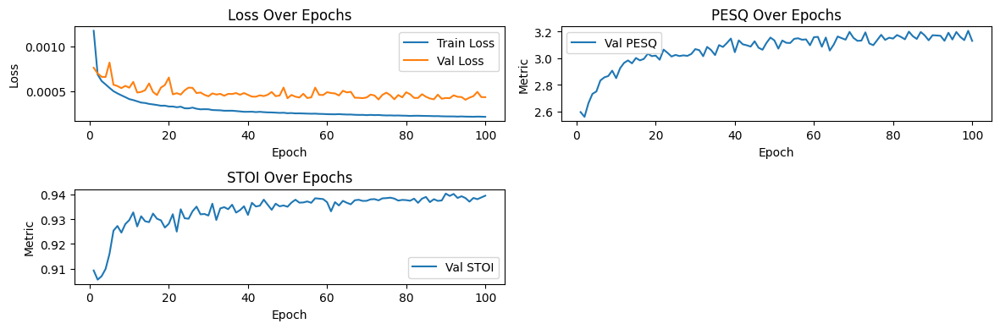

In [ ]:
epochs_range = range(1, num_epochs+1)

plt.figure(figsize=(12, 4))

plt.subplot(2, 2, 1)
plt.plot(epochs_range, train_losses, label='Train Loss')
plt.plot(epochs_range, val_losses,   label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss Over Epochs')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(epochs_range, val_pesqs, label='Val PESQ')
# plt.plot(epochs_range, val_stois, label='Val STOI')
plt.xlabel('Epoch')
plt.ylabel('Metric')
plt.title('PESQ Over Epochs')
plt.legend()

plt.subplot(2, 2, 3)
# plt.plot(epochs_range, val_pesqs, label='Val PESQ')
plt.plot(epochs_range, val_stois, label='Val STOI')
plt.xlabel('Epoch')
plt.ylabel('Metric')
plt.title('STOI Over Epochs')
plt.legend()


plt.tight_layout()
plt.show()


## Evluation on Test

In [ ]:
# Load best model
best_model = WaveUNet(num_channels=1, base_filters=16, depth=6).to(device)
best_model.load_state_dict(torch.load(save_path))
best_model.eval()

# Evaluate on test set: PESQ & STOI
test_loss_sum = 0.0
with torch.no_grad():
    for k, (noisy_test, clean_test) in enumerate(test_loader):
        noisy_test, clean_test = noisy_test.to(device), clean_test.to(device)
        out_test = best_model(noisy_test)

        t_loss = criterion(out_test, clean_test)
        test_loss_sum += t_loss.item()

test_loss_final = test_loss_sum / (k+1)
print("Test Loss:", test_loss_final)

test_pesq, test_stoi_val = eval_pesq_stoi(best_model, test_loader, fs=8000)
print("Test PESQ:", test_pesq, "Test STOI:", test_stoi_val)


<ipython-input-239-6fad39c8f4ec>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model.load_state_dict(torch.load(save_path))


Test Loss: 0.0003977763969750415
Test PESQ: 3.1635162627605524 Test STOI: 0.9428484217633042


In [ ]:
noisy_sample, clean_sample = test_set[560]  # test sample
noisy_sample = noisy_sample.unsqueeze(0).to(device)

best_model.eval()
with torch.no_grad():
    denoised_sample = best_model(noisy_sample).squeeze(0).cpu().numpy()

clean_sample_np = clean_sample.squeeze(0).cpu().numpy()
noisy_sample_np = noisy_sample.squeeze(0).cpu().numpy()
noisy_sample_np = noisy_sample_np.squeeze()


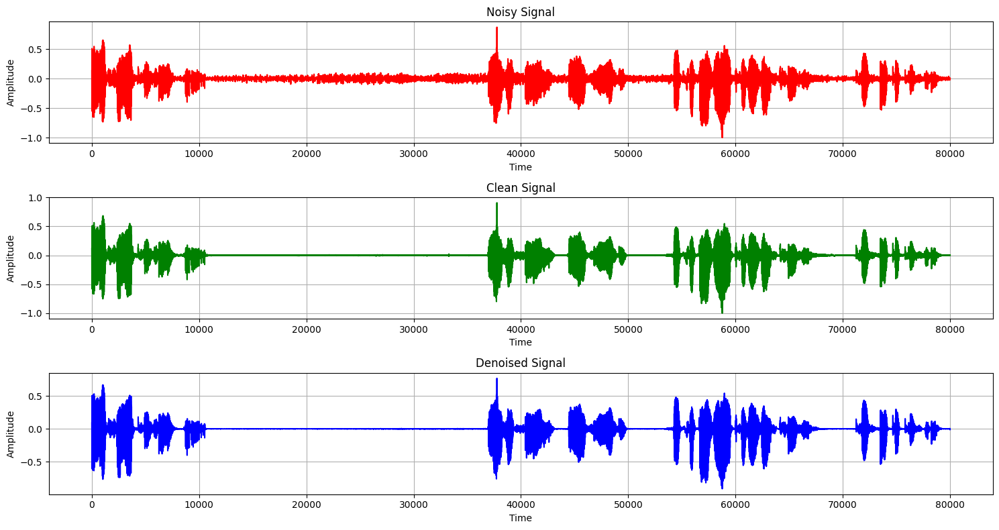

In [ ]:
# waveforms
plt.figure(figsize=(15, 8))

plt.subplot(3, 1, 1)
plt.plot(noisy_sample_np, color='r')
plt.title('Noisy Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.grid(True)

plt.subplot(3, 1, 2)
plt.plot(clean_sample_np, color='g')
plt.title('Clean Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.grid(True)

plt.subplot(3, 1, 3)
plt.plot(denoised_sample.squeeze(), color='b')
plt.title('Denoised Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.grid(True)

plt.tight_layout()
plt.show()


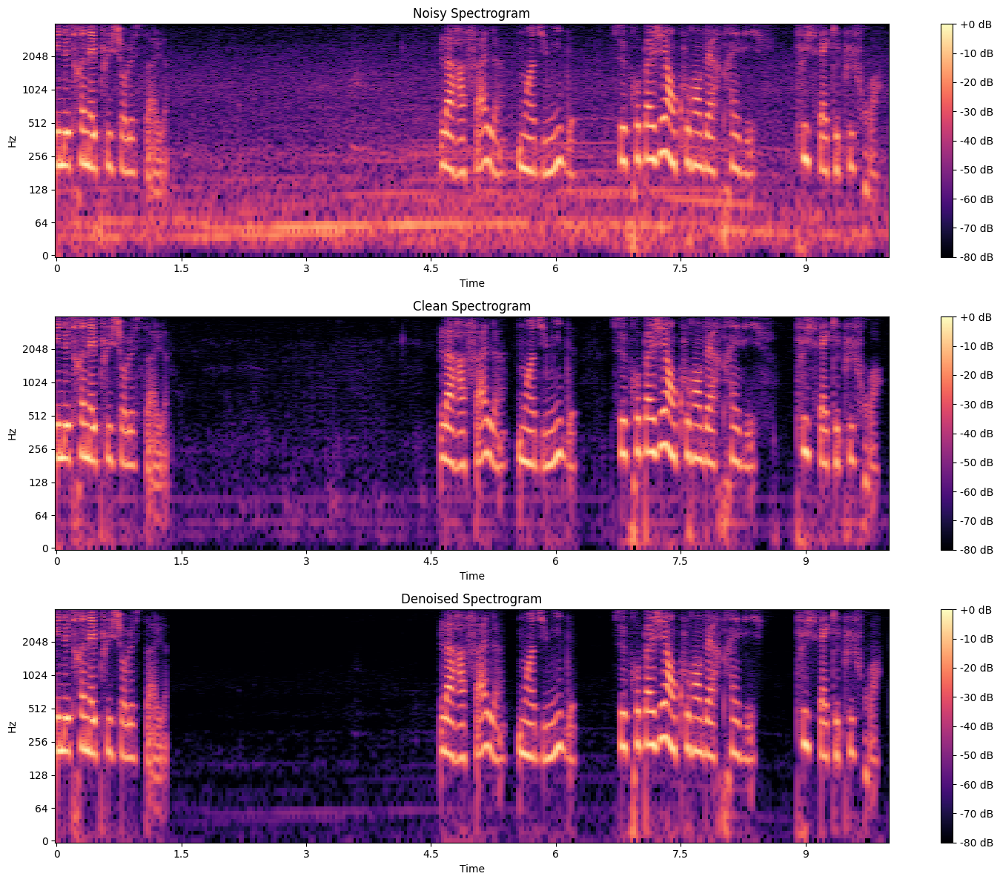

In [ ]:
n_fft = 1024
hop_length = 256
# Spectrograms
noisy_spec = librosa.amplitude_to_db(np.abs(librosa.stft(noisy_sample_np, n_fft=n_fft, hop_length=hop_length)),ref=np.max)
clean_spec = librosa.amplitude_to_db(np.abs(librosa.stft(clean_sample_np, n_fft=n_fft, hop_length=hop_length)),ref=np.max)
denoised_spec = librosa.amplitude_to_db(np.abs(librosa.stft(denoised_sample.squeeze(), n_fft=n_fft, hop_length=hop_length)),ref=np.max)

plt.figure(figsize=(15, 12))

plt.subplot(3, 1, 1)
librosa.display.specshow(noisy_spec, sr=8000, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format='%+2.0f dB')
plt.title('Noisy Spectrogram')

plt.subplot(3, 1, 2)
librosa.display.specshow(clean_spec, sr=8000, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format="%+2.0f dB")
plt.title('Clean Spectrogram')

plt.subplot(3, 1, 3)
librosa.display.specshow(denoised_spec, sr=8000, hop_length=hop_length, x_axis='time', y_axis='log')
plt.colorbar(format="%+2.0f dB")
plt.title('Denoised Spectrogram')

plt.tight_layout()
plt.show()


In [ ]:
print("Noisy Audio:")
ipd.display(ipd.Audio(noisy_sample_np, rate=8000))

print("Clean Audio:")
ipd.display(ipd.Audio(clean_sample_np, rate=8000))

print("Denoised Audio:")
ipd.display(ipd.Audio(denoised_sample.squeeze(), rate=8000))


Noisy Audio:


Clean Audio:


Denoised Audio:


# Tasnet and ConvTasNet

TASNET ARCHITECTURE


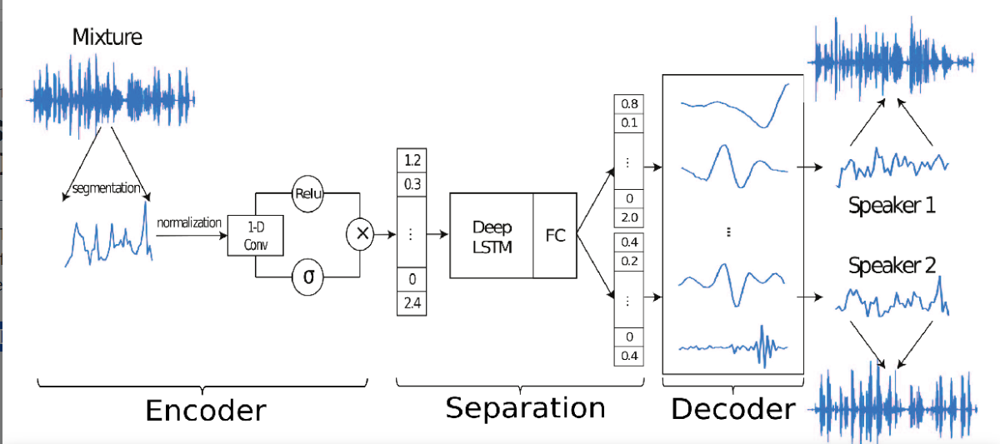

CONVTASNET ARCHITECTURE


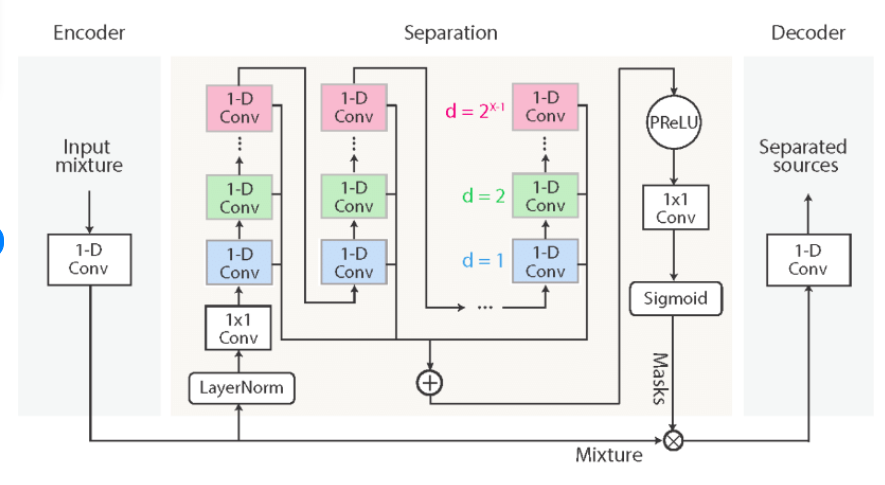

In [ ]:
from IPython.display import Image, display

# TASNET Image
print("TASNET ARCHITECTURE")
display(Image(filename='/content/TASNETR.png', width=800))
print("CONVTASNET ARCHITECTURE")
# ConvTASNET Image
display(Image(filename='/content/convtasnetr.png', width=800))


# Imports

In [ ]:
pip install pystoi batch-pystoi pesq tqdm torchinfo librosa


  Preparing metadata (setup.py) ... done
  Created wheel for pesq: filename=pesq-0.0.4-cp310-cp310-linux_x86_64.whl size=262945 sha256=2c14b5e6115a4204c6605f64a668b3da2f7b04c75bb486e7f790659e1eb6e282
  Stored in directory: /root/.cache/pip/wheels/c5/4e/2c/251524370c0fdd659e99639a0fbd0ca5a782c3aafcd456b28d
Successfully built pesq


In [ ]:
import numpy as np
import matplotlib.pylab as plt
import scipy
import IPython.display as ipd
from scipy.signal import resample
import os
from torch.utils.data import Dataset
import torchaudio
import torchaudio.transforms as T
import torch

from pesq import pesq_batch
from itertools import permutations
from pesq import pesq
from pystoi import stoi
from tqdm import tqdm
from batch_pystoi import stoi as stoi_batch
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.optim import Adam
import matplotlib.pyplot as plt
from  torchinfo import summary
import librosa

import random
from scipy.io import wavfile
from torch.utils.data import Dataset, DataLoader

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Data preprocessing

In [ ]:
noisy_path = '/content/drive/MyDrive/data/denoising_data/'
xtrain_path = noisy_path + 'train/'
xtest_path = noisy_path + 'test/'
xsample_path = noisy_path + 'train_small/'

origin_path = '/content/drive/MyDrive/data/voice_origin/'
ytrain_path = origin_path + 'train/'
ytest_path = origin_path + 'test/'
ysample_path = origin_path + 'train_small/'


In [ ]:
print(len(os.listdir(xtrain_path)))
print(len(os.listdir(ytrain_path)))
print(len(os.listdir(xtest_path)))
print(len(os.listdir(ytest_path)))

2118
2118
782
782


In [ ]:
# See a sample from the samples set

noisy_files = [f for f in os.listdir(xsample_path) if f.lower().endswith('.wav')]
clean_files = [f for f in os.listdir(ysample_path) if f.lower().endswith('.wav')]

print(f"Noisy folder: {xsample_path}")
print(f"Original folder: {ysample_path}")
print(f"Noisy files found: {len(noisy_files)}")
print(f"Original files found: {len(clean_files)}")

common_files = list(set(noisy_files).intersection(clean_files))
print(f"Common files: {len(common_files)}")

# Pick matching file at random
sample_file = random.choice(common_files)
print("Sample file chosen:", sample_file)

noisy_file_path = os.path.join(xsample_path, sample_file)
clean_file_path = os.path.join(ysample_path, sample_file)

fs_noisy, sig_noisy = wavfile.read(noisy_file_path)
fs_clean, sig_clean = wavfile.read(clean_file_path)


print("noisy signal:", sample_file)
display(ipd.Audio(data=sig_noisy, rate=fs_noisy))

print("Original signal:", sample_file)
display(ipd.Audio(data=sig_clean, rate=fs_clean))


print("Noisy length:", sig_noisy.shape, "samples")
print("Original length:", sig_clean.shape, "samples")
print("Sampling rates :", fs_noisy, fs_clean)

Noisy folder: /content/drive/MyDrive/data/denoising_data/train_small/
Original folder: /content/drive/MyDrive/data/voice_origin/train_small/
Noisy files found: 10
Original files found: 10
Common files: 10
Sample file chosen: Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_9_.wav
noisy signal: Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_9_.wav


Original signal: Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_9_.wav
Noisy length: (80000,) samples
Original length: (40000,) samples
Sampling rates : 8000 4000


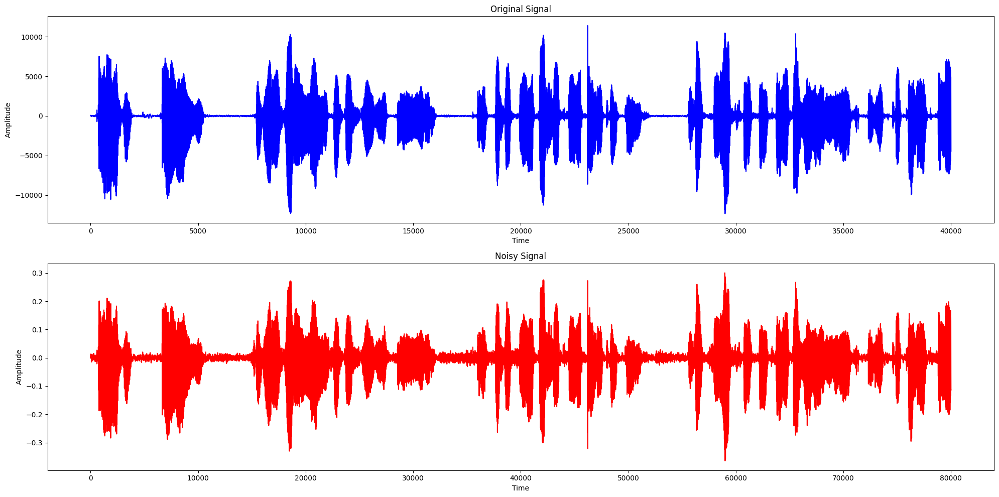

In [ ]:
from pathlib import Path
import scipy.io.wavfile
import matplotlib.pyplot as plt
import os

# Paths for noisy and original datasets
noisy_path = '/content/drive/MyDrive/data/denoising_data/'
origin_path = '/content/drive/MyDrive/data/voice_origin/'

# Example: Compare one file from train_small
noisy_file_path = os.path.join(noisy_path, 'train_small/Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_9_.wav')
original_file_path = os.path.join(origin_path, 'train_small/Jules_Verne_-_L_ile_mysterieuse_Partie1_Chap01_9_.wav')

# Read the noisy signal
fs_noisy, sig_noisy = scipy.io.wavfile.read(noisy_file_path)
assert fs_noisy == 8000, f"Unexpected sample rate for noisy signal: {fs_noisy}"
assert len(sig_noisy) == 80000, f"Unexpected signal length for noisy signal: {len(sig_noisy)}"

# Read the original signal
fs_original, sig_original = scipy.io.wavfile.read(original_file_path)
assert fs_original == 4000, f"Unexpected sample rate for original signal: {fs_original}"
assert len(sig_original) == 40000, f"Unexpected signal length for original signal: {len(sig_original)}"

# Plot the signals
plt.figure(figsize=(20, 10))

# Plot original signal
plt.subplot(2, 1, 1)
plt.plot(sig_original, label='Original signal', color='blue')
plt.title('Original Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')

# Plot noisy signal
plt.subplot(2, 1, 2)
plt.plot(sig_noisy, label='Noisy signal', color='red')
plt.title('Noisy Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')

# Show the plot
plt.tight_layout()
plt.show()


# TASNET

In [ ]:
import torch as th
import torch.nn as nn
import numpy as np

class TasNET(nn.Module):
    def __init__(self, batch_size, samples=40, features=500, num_layers=2, hidden_size=500, dropout=0,
                 bidirectional=True):
        super(TasNET, self).__init__()
        self.features = features
        self.batch = batch_size
        self.samples = samples
        self.conv1 = nn.Linear(samples, features, bias=False)
        self.conv2 = nn.Linear(samples, features, bias=False)
        self.ReLU = nn.ReLU()
        self.Sigmoid = nn.Sigmoid()
        self.LayerNorm = nn.LayerNorm(features, 0)
        self.LSTM12 = nn.LSTM(features, hidden_size, num_layers, batch_first=True,
                               dropout=dropout, bidirectional=bidirectional)
        self.LSTM34 = nn.LSTM(2 * hidden_size, hidden_size, num_layers, batch_first=True,
                               dropout=dropout, bidirectional=bidirectional)
        self.Linear = nn.Linear(2 * hidden_size, 2 * features)
        self.Softmax = nn.Softmax(-1)
        self.reconv = nn.Linear(features, samples, bias=False)

    def forward(self, x):

        # Normalize before TasNET
        fac = x.std(dim=2, keepdim=True)
        x = x / fac

        # Ensure the input length is divisible by `samples`
        batch_size, seq_length = x.size(0), x.size(2)
        if seq_length % self.samples != 0:
            # Truncate to the nearest multiple of `samples`
            new_seq_length = (seq_length // self.samples) * self.samples
            x = x[:, :, :new_seq_length]


        # Reshape input to match the `Linear` layer
        x = x.view(batch_size, -1, self.samples)  # (batch_size, time_chunks, samples)


        # Encoder part
        x_conv1 = self.conv1(x)  # (batch_size, time_chunks, features)
        x_conv2 = self.conv2(x)  # (batch_size, time_chunks, features)
        x_non1 = self.ReLU(x_conv1)
        x_non2 = self.Sigmoid(x_conv2)
        w = x_non1 * x_non2


        # Layer norm before LSTM
        x = self.LayerNorm(w)


        # LSTM layers
        x_LSTM2, _ = self.LSTM12(x)
        x_LSTM4, _ = self.LSTM34(x_LSTM2)
        x = th.add(x_LSTM2, x_LSTM4)


        # Linear and softmax
        x = self.Linear(x)
        x = x.view(batch_size, -1, 2)  # (batch_size, time_chunks * features, 2)
        m = self.Softmax(x)
        m1 = m[:, :, 0].view(batch_size, -1, self.features)
        m2 = m[:, :, 1].view(batch_size, -1, self.features)
        x1 = w * m1
        x2 = w * m2

        # Decoder
        x1 = self.reconv(x1)
        x2 = self.reconv(x2)


        # Reverse normalization
        x1 = x1 * fac
        x2 = x2 * fac

        # Reshape for output
        x1 = x1.view(batch_size, -1)  # (batch_size, full_sequence_length)
        x2 = x2.view(batch_size, -1)  # (batch_size, full_sequence_length)

        return x1, x2



In [ ]:
def test_model():
    x = th.FloatTensor(th.randn(128,100,40))
    fac = th.std(x,2)
    fac = fac.view(128,100,1)
    x = x/fac
    x = x*fac
    Tas = TasNET(128)
    output1, output2=Tas(x)
    #print(output)

    print(Tas)
if __name__ == '__main__':
    test_model()

TasNET(
  (conv1): Linear(in_features=40, out_features=500, bias=False)
  (conv2): Linear(in_features=40, out_features=500, bias=False)
  (ReLU): ReLU()
  (Sigmoid): Sigmoid()
  (LayerNorm): LayerNorm((500,), eps=0, elementwise_affine=True)
  (LSTM12): LSTM(500, 500, num_layers=2, batch_first=True, bidirectional=True)
  (LSTM34): LSTM(1000, 500, num_layers=2, batch_first=True, bidirectional=True)
  (Linear): Linear(in_features=1000, out_features=1000, bias=True)
  (Softmax): Softmax(dim=-1)
  (reconv): Linear(in_features=500, out_features=40, bias=False)
)


# Conv-TasNet

In [ ]:
import torch
import torch.nn as nn


class GlobalLayerNorm(nn.Module):
    '''
       Calculate Global Layer Normalization
       dim: (int or list or torch.Size) –
            input shape from an expected input of size
       eps: a value added to the denominator for numerical stability.
       elementwise_affine: a boolean value that when set to True,
           this module has learnable per-element affine parameters
           initialized to ones (for weights) and zeros (for biases).
    '''

    def __init__(self, dim, eps=1e-05, elementwise_affine=True):
        super(GlobalLayerNorm, self).__init__()
        self.dim = dim
        self.eps = eps
        self.elementwise_affine = elementwise_affine

        if self.elementwise_affine:
            self.weight = nn.Parameter(torch.ones(self.dim, 1))
            self.bias = nn.Parameter(torch.zeros(self.dim, 1))
        else:
            self.register_parameter('weight', None)
            self.register_parameter('bias', None)

    def forward(self, x):
        # x = N x C x L
        # N x 1 x 1
        # cln: mean,var N x 1 x L
        # gln: mean,var N x 1 x 1
        if x.dim() != 3:
            raise RuntimeError("{} accept 3D tensor as input".format(
                self.__name__))

        mean = torch.mean(x, (1, 2), keepdim=True)
        var = torch.mean((x-mean)**2, (1, 2), keepdim=True)
        # N x C x L
        if self.elementwise_affine:
            x = self.weight*(x-mean)/torch.sqrt(var+self.eps)+self.bias
        else:
            x = (x-mean)/torch.sqrt(var+self.eps)
        return x


class CumulativeLayerNorm(nn.LayerNorm):
    '''
       Calculate Cumulative Layer Normalization
       dim: you want to norm dim
       elementwise_affine: learnable per-element affine parameters
    '''

    def __init__(self, dim, elementwise_affine=True):
        super(CumulativeLayerNorm, self).__init__(
            dim, elementwise_affine=elementwise_affine)

    def forward(self, x):
        # x: N x C x L
        # N x L x C
        x = torch.transpose(x, 1, 2)
        # N x L x C == only channel norm
        x = super().forward(x)
        # N x C x L
        x = torch.transpose(x, 1, 2)
        return x


def select_norm(norm, dim):
    if norm not in ['gln', 'cln', 'bn']:
        if x.dim() != 3:
            raise RuntimeError("{} accept 3D tensor as input".format(
                self.__name__))

    if norm == 'gln':
        return GlobalLayerNorm(dim, elementwise_affine=True)
    if norm == 'cln':
        return CumulativeLayerNorm(dim, elementwise_affine=True)
    else:
        return nn.BatchNorm1d(dim)


class Conv1D(nn.Conv1d):
    '''
       Applies a 1D convolution over an input signal composed of several input planes.
    '''

    def __init__(self, *args, **kwargs):
        super(Conv1D, self).__init__(*args, **kwargs)

    def forward(self, x, squeeze=False):
        # x: N x C x L
        if x.dim() not in [2, 3]:
            raise RuntimeError("{} accept 2/3D tensor as input".format(
                self.__name__))
        x = super().forward(x if x.dim() == 3 else torch.unsqueeze(x, 1))
        if squeeze:
            x = torch.squeeze(x)
        return x


class ConvTrans1D(nn.ConvTranspose1d):
    '''
       This module can be seen as the gradient of Conv1d with respect to its input.
       It is also known as a fractionally-strided convolution
       or a deconvolution (although it is not an actual deconvolution operation).
    '''

    def __init__(self, *args, **kwargs):
        super(ConvTrans1D, self).__init__(*args, **kwargs)

    def forward(self, x, squeeze=False):
        """
        x: N x L or N x C x L
        """
        if x.dim() not in [2, 3]:
            raise RuntimeError("{} accept 2/3D tensor as input".format(
                self.__name__))
        x = super().forward(x if x.dim() == 3 else torch.unsqueeze(x, 1))
        if squeeze:
            x = torch.squeeze(x)
        return x


class Conv1D_Block(nn.Module):
    '''
       Consider only residual links
    '''

    def __init__(self, in_channels=256, out_channels=512,
                 kernel_size=3, dilation=1, norm='gln', causal=False):
        super(Conv1D_Block, self).__init__()
        # conv 1 x 1
        self.conv1x1 = Conv1D(in_channels, out_channels, 1)
        self.PReLU_1 = nn.PReLU()
        self.norm_1 = select_norm(norm, out_channels)
        # not causal don't need to padding, causal need to pad+1 = kernel_size
        self.pad = (dilation * (kernel_size - 1)) // 2 if not causal else (
            dilation * (kernel_size - 1))
        # depthwise convolution
        self.dwconv = Conv1D(out_channels, out_channels, kernel_size,
                             groups=out_channels, padding=self.pad, dilation=dilation)
        self.PReLU_2 = nn.PReLU()
        self.norm_2 = select_norm(norm, out_channels)
        self.Sc_conv = nn.Conv1d(out_channels, in_channels, 1, bias=True)
        self.causal = causal

    def forward(self, x):
        # x: N x C x L
        # N x O_C x L
        c = self.conv1x1(x)
        # N x O_C x L
        c = self.PReLU_1(c)
        c = self.norm_1(c)
        # causal: N x O_C x (L+pad)
        # noncausal: N x O_C x L
        c = self.dwconv(c)
        # N x O_C x L
        if self.causal:
            c = c[:, :, :-self.pad]
        c = self.Sc_conv(c)
        return x+c


class ConvTasNet(nn.Module):
    '''
       ConvTasNet module
       N	Number of ﬁlters in autoencoder
       L	Length of the ﬁlters (in samples)
       B	Number of channels in bottleneck and the residual paths’ 1 × 1-conv blocks
       Sc	Number of channels in skip-connection paths’ 1 × 1-conv blocks
       H	Number of channels in convolutional blocks
       P	Kernel size in convolutional blocks
       X	Number of convolutional blocks in each repeat
       R	Number of repeats
    '''

    def __init__(self,
                 N=512,
                 L=16,
                 B=128,
                 H=512,
                 P=3,
                 X=8,
                 R=3,
                 norm="gln",
                 num_spks=2,
                 activate="relu",
                 causal=False):
        super(ConvTasNet, self).__init__()
        # n x 1 x T => n x N x T
        self.encoder = Conv1D(1, N, L, stride=L // 2, padding=0)
        # n x N x T  Layer Normalization of Separation
        self.LayerN_S = select_norm('cln', N)
        # n x B x T  Conv 1 x 1 of  Separation
        self.BottleN_S = Conv1D(N, B, 1)
        # Separation block
        # n x B x T => n x B x T
        self.separation = self._Sequential_repeat(
            R, X, in_channels=B, out_channels=H, kernel_size=P, norm=norm, causal=causal)
        # n x B x T => n x 2*N x T
        self.gen_masks = Conv1D(B, num_spks*N, 1)
        # n x N x T => n x 1 x L
        self.decoder = ConvTrans1D(N, 1, L, stride=L//2)
        # activation function
        active_f = {
            'relu': nn.ReLU(),
            'sigmoid': nn.Sigmoid(),
            'softmax': nn.Softmax(dim=0)
        }
        self.activation_type = activate
        self.activation = active_f[activate]
        self.num_spks = num_spks

    def _Sequential_block(self, num_blocks, **block_kwargs):
        '''
           Sequential 1-D Conv Block
           input:
                 num_block: how many blocks in every repeats
                 **block_kwargs: parameters of Conv1D_Block
        '''
        Conv1D_Block_lists = [Conv1D_Block(
            **block_kwargs, dilation=(2**i)) for i in range(num_blocks)]

        return nn.Sequential(*Conv1D_Block_lists)

    def _Sequential_repeat(self, num_repeats, num_blocks, **block_kwargs):
        '''
           Sequential repeats
           input:
                 num_repeats: Number of repeats
                 num_blocks: Number of block in every repeats
                 **block_kwargs: parameters of Conv1D_Block
        '''
        repeats_lists = [self._Sequential_block(
            num_blocks, **block_kwargs) for i in range(num_repeats)]
        return nn.Sequential(*repeats_lists)

    def forward(self, x):
        if x.dim() >= 3:
            raise RuntimeError(
                "{} accept 1/2D tensor as input, but got {:d}".format(
                  self.__class__.__name__, x.dim()))
        if x.dim() == 1:
            x = torch.unsqueeze(x, 0)
        # x: n x 1 x L => n x N x T
        w = self.encoder(x)
        # n x N x L => n x B x L
        e = self.LayerN_S(w)
        e = self.BottleN_S(e)
        # n x B x L => n x B x L
        e = self.separation(e)
        # n x B x L => n x num_spk*N x L
        m = self.gen_masks(e)
        # n x N x L x num_spks
        m = torch.chunk(m, chunks=self.num_spks, dim=1)
        # num_spks x n x N x L
        m = self.activation(torch.stack(m, dim=0))
        d = [w*m[i] for i in range(self.num_spks)]
        # decoder part num_spks x n x L
        s = [self.decoder(d[i], squeeze=True) for i in range(self.num_spks)]
        return s


def check_parameters(net):
    '''
        Returns module parameters. Mb
    '''
    parameters = sum(param.numel() for param in net.parameters())
    return parameters / 10**6


def test_convtasnet():
    x = torch.randn(320)
    nnet = ConvTasNet()
    s = nnet(x)
    print(str(check_parameters(nnet))+' Mb')
    print(s[1].shape)


if __name__ == "__main__":
    test_convtasnet()

3.475121 Mb
torch.Size([320])


In [ ]:
conv_tasnet = ConvTasNet(
    N=512, # Number of ﬁlters in autoencoder
    L=16, # Length of the ﬁlters (in samples)
    B=128, # Number of channels in bottleneck and the residual paths’ 1 × 1-conv blocks
    H=512, # Number of channels in convolutional blocks
    P=3, # Kernel size in convolutional blocks
    X=8, # Number of convolutional blocks in each repeat
    R=3, # Number of repeats
    norm="gln",
    num_spks=1,
    activate="relu",
    causal=False
)

In [ ]:
summary(conv_tasnet, input_size=(1, 80000), verbose=0, device='cuda')

Layer (type:depth-idx)                        Output Shape              Param #
ConvTasNet                                    [80000]                   --
├─Conv1D: 1-1                                 [1, 512, 9999]            8,704
├─CumulativeLayerNorm: 1-2                    [1, 512, 9999]            1,024
├─Conv1D: 1-3                                 [1, 128, 9999]            65,664
├─Sequential: 1-4                             [1, 128, 9999]            --
│    └─Sequential: 2-1                        [1, 128, 9999]            --
│    │    └─Conv1D_Block: 3-1                 [1, 128, 9999]            135,810
│    │    └─Conv1D_Block: 3-2                 [1, 128, 9999]            135,810
│    │    └─Conv1D_Block: 3-3                 [1, 128, 9999]            135,810
│    │    └─Conv1D_Block: 3-4                 [1, 128, 9999]            135,810
│    │    └─Conv1D_Block: 3-5                 [1, 128, 9999]            135,810
│    │    └─Conv1D_Block: 3-6                 [1, 128, 9999]

# Metrics

In [ ]:
# Taken from the Conv-TasNet Github repo
def sisnr(x, s, eps=1e-8):
    """
    calculate training loss
    input:
          x: separated signal, N x S tensor
          s: reference signal, N x S tensor
    Return:
          sisnr: N tensor
    """

    def l2norm(mat, keepdim=False):
        return torch.norm(mat, dim=-1, keepdim=keepdim)

    if x.shape != s.shape:
        raise RuntimeError(
            "Dimention mismatch when calculate si-snr, {} vs {}".format(
                x.shape, s.shape))
    x_zm = x - torch.mean(x, dim=-1, keepdim=True)
    s_zm = s - torch.mean(s, dim=-1, keepdim=True)
    t = torch.sum(
        x_zm * s_zm, dim=-1,
        keepdim=True) * s_zm / (l2norm(s_zm, keepdim=True)**2 + eps)
    return 20 * torch.log10(eps + l2norm(t) / (l2norm(x_zm - t) + eps))

def si_snr_loss(ests, refs, eps=1e-8):
    # Ensure tensors have the correct shape and type
    if ests.dim() == 3:
        ests = ests.squeeze(1)
    if refs.dim() == 3:
        refs = refs.squeeze(1)

    ests = ests.float()
    refs = refs.float()

    print(f"ests shape: {ests.shape}, refs shape: {refs.shape}")  # Debugging shapes
    print(f"ests type: {ests.dtype}, refs type: {refs.dtype}")  # Debugging types

    # Normalize reference signals
    refs_energy = torch.sum(refs ** 2, dim=-1, keepdim=True)
    projection = torch.sum(ests * refs, dim=-1, keepdim=True) * refs / (refs_energy + eps)
    noise = ests - projection

    # Compute SI-SNR
    si_snr = 10 * torch.log10(torch.sum(projection ** 2, dim=-1) / (torch.sum(noise ** 2, dim=-1) + eps))
    return -torch.mean(si_snr)


In [ ]:

class AudioDenoisingDataset(Dataset):
    def __init__(self, noisy_dir, clean_dir, split=None, p=1.0):
        """
        - noisy_dir: folder with .wav files (noisy)
        - clean_dir: folder with .wav files (clean)
        - split: 'train' or 'val' or None
        - p: fraction used for train if split='train', leftover for val
        """
        noisy_files = sorted([f for f in os.listdir(noisy_dir) if f.endswith('.wav')])
        clean_files = sorted([f for f in os.listdir(clean_dir) if f.endswith('.wav')])

        # Match them by filename
        pairs = []
        for cf in clean_files:
            if cf in noisy_files:
                pairs.append((os.path.join(noisy_dir, cf),
                              os.path.join(clean_dir, cf)))

        np.random.shuffle(pairs)
        limit = int(len(pairs) * p)
        if split == 'train':
            pairs = pairs[:limit]
        elif split == 'val':
            pairs = pairs[limit:]

        self.noisy_list = [p[0] for p in pairs]
        self.clean_list = [p[1] for p in pairs]

    def __len__(self):
        return len(self.noisy_list)

    def __getitem__(self, idx):
        # Read files
        noisy_path = self.noisy_list[idx]
        clean_path = self.clean_list[idx]

        fs_noisy, sig_noisy = wavfile.read(noisy_path)
        fs_clean, sig_clean = wavfile.read(clean_path)
        sig_noisy = sig_noisy.astype(np.float32)
        sig_clean = sig_clean.astype(np.float32)

        # Normalization
        sig_noisy = normalize_signal(sig_noisy, method='peak')
        sig_clean = normalize_signal(sig_clean,method='peak')

        # Convert to Torch Tensors shape [1, T]
        noisy_t = torch.from_numpy(sig_noisy).unsqueeze(0)
        clean_t = torch.from_numpy(sig_clean).unsqueeze(0)

        return noisy_t, clean_t


In [ ]:
train_set = AudioDenoisingDataset(noisy_dir=xtrain_path, clean_dir=ytrain_path, split='train', p=0.85)
val_set   = AudioDenoisingDataset(noisy_dir=xtrain_path, clean_dir=ytrain_path, split='val',   p=0.85)
test_set  = AudioDenoisingDataset(noisy_dir=xtest_path,  clean_dir=ytest_path)

train_loader = DataLoader(train_set, batch_size=1, shuffle=True)
val_loader   = DataLoader(val_set,   batch_size=1, shuffle=False)
test_loader  = DataLoader(test_set,  batch_size=1, shuffle=False)

print("Train:", len(train_set), "Val:", len(val_set), "Test:", len(test_set))

Train: 1800 Val: 318 Test: 782


In [ ]:
def normalize_signal(signal, method='peak'):
    """
    Normalize an audio signal by either:
      - 'peak': dividing by max absolute value (peak normalization)
      - 'rms': dividing by root-mean-square amplitude (RMS normalization)
    """
    float_signal = signal.astype(np.float32)

    if method == 'peak':
        max_val = np.max(np.abs(float_signal))
        if max_val < 1e-8:
            # Avoid div by zero if it's near-silent
            return float_signal
        return float_signal / max_val

    elif method == 'rms':
        rms = np.sqrt(np.mean(float_signal**2))
        if rms < 1e-8:
            return float_signal
        return float_signal / rms

    else:
        raise ValueError(f"Unknown method '{method}'. Choose 'peak' or 'rms'.")

In [ ]:
class WarmupScheduler:
    def __init__(self, optimizer, warmup_iters, target_lr):
        self.optimizer = optimizer
        self.warmup_iters = warmup_iters
        self.target_lr = target_lr
        self.current_iter = 0

    def step(self):
        self.current_iter += 1
        if self.current_iter <= self.warmup_iters:
            # exponentially increase the learning rate
            warmup_lr = self.target_lr * (self.current_iter / self.warmup_iters) ** 2
            for param_group in self.optimizer.param_groups:
                param_group['lr'] = warmup_lr

    def is_warmup_done(self):
        return self.current_iter >= self.warmup_iters

# Train

In [ ]:
from tqdm import tqdm
import torch

def train(
    model,
    train_dataloader,
    val_dataloader,
    device,
    optimizer,
    criterion,
    save_to,
    num_epochs=10,
):
    # Initialize lists to store metrics
    train_losses, val_losses = [], []
    train_pesqs, val_pesqs = [], []
    train_stois, val_stois = [], []
    learning_rates = []

    model.to(device)
    print(f"Model type: {type(model)}")

    for epoch in range(num_epochs):
        model.train()
        train_loss, train_pesq, train_stoi = 0.0, 0.0, 0.0
        val_loss, val_pesq, val_stoi = 0.0, 0.0, 0.0

        print(f"Epoch {epoch + 1}/{num_epochs}")

        # Training
        for noisy_t, clean_t in tqdm(train_dataloader, desc=f"Training Batches {epoch + 1}/{num_epochs}"):
            noisy_t, clean_t = noisy_t.to(device), clean_t.to(device)

            if noisy_t.dim() == 2:
                noisy_t = noisy_t.unsqueeze(1)
            if clean_t.dim() == 3:
                clean_t = clean_t.squeeze(1)

            optimizer.zero_grad()

            # Forward pass
            outputs = model(noisy_t)
            predictions = outputs[0]  # Model output for the first speaker
            loss = criterion(predictions, clean_t)  # Match dimensions for loss
            train_loss += loss.item()

            # Backward pass
            loss.backward()
            optimizer.step()

            # Calculate PESQ and STOI for training data
            sample_rate = 8000  # Fixed sample rate
            voice_origin = clean_t.cpu().numpy()
            prediction = predictions.cpu().detach().numpy()

            # Ensure arrays are 2D
            if voice_origin.ndim == 1:
                voice_origin = voice_origin[np.newaxis, :]
            if prediction.ndim == 1:
                prediction = prediction[np.newaxis, :]

            train_pesq += pesq_batch(sample_rate, voice_origin, prediction, mode="nb")[0]
            train_stoi += stoi_batch(prediction, voice_origin, sample_rate)[0]

        # Average training metrics
        train_loss /= len(train_dataloader)
        train_pesq /= len(train_dataloader)
        train_stoi /= len(train_dataloader)
        train_losses.append(train_loss)
        train_pesqs.append(train_pesq)
        train_stois.append(train_stoi)

        # Validation
        model.eval()
        with torch.no_grad():
            for noisy_t, clean_t in val_dataloader:
                noisy_t, clean_t = noisy_t.to(device), clean_t.to(device)

                if noisy_t.dim() == 2:
                    noisy_t = noisy_t.unsqueeze(1)
                if clean_t.dim() == 3:
                    clean_t = clean_t.squeeze(1)

                outputs = model(noisy_t)
                predictions = outputs[0]
                loss = criterion(predictions, clean_t)
                val_loss += loss.item()

                # Calculate PESQ and STOI for validation data
                voice_origin = clean_t.cpu().numpy()
                prediction = predictions.cpu().detach().numpy()

                # Ensure arrays are 2D
                if voice_origin.ndim == 1:
                    voice_origin = voice_origin[np.newaxis, :]
                if prediction.ndim == 1:
                    prediction = prediction[np.newaxis, :]

                val_pesq += pesq_batch(sample_rate, voice_origin, prediction, mode="nb")[0]
                val_stoi += stoi_batch(prediction, voice_origin, sample_rate)[0]

        # Average validation metrics
        val_loss /= len(val_dataloader)
        val_pesq /= len(val_dataloader)
        val_stoi /= len(val_dataloader)
        val_losses.append(val_loss)
        val_pesqs.append(val_pesq)
        val_stois.append(val_stoi)

        # Print metrics for both training and validation on the same line
        print(
            f"Epoch {epoch + 1}/{num_epochs} - "
            f"Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f} | "
            f"Train PESQ: {train_pesq:.4f}, Val PESQ: {val_pesq:.4f} | "
            f"Train STOI: {train_stoi:.4f}, Val STOI: {val_stoi:.4f} | "
            f"Learning Rate: {optimizer.param_groups[0]['lr']:.6f}"
        )

    # Save the model
    torch.save(model.state_dict(), save_to)
    print("Model saved successfully.")

    # Return all metrics
    return train_losses, val_losses, train_pesqs, val_pesqs, train_stois, val_stois, learning_rates


# Test

In [ ]:
def test_model(model, test_dataloader, device, criterion):
    model.eval()
    test_loss = 0.0
    test_pesq = 0.0
    test_stoi = 0.0

    with torch.no_grad():
        for noisy_t, clean_t in tqdm(test_dataloader):
            # Ensure input tensors are [batch_size, time]
            if noisy_t.dim() == 3:  # If input has an extra dimension
                noisy_t = noisy_t.squeeze(1)
            if clean_t.dim() == 3:  # If target has an extra dimension
                clean_t = clean_t.squeeze(1)

            # Reshape tensors to match TasNET input requirements
            if noisy_t.dim() == 2:  # [batch_size, time]
                noisy_t = noisy_t.unsqueeze(1)  # Add channel dimension
            if clean_t.dim() == 2:
                clean_t = clean_t.unsqueeze(1)

            # Move tensors to the correct device
            noisy_t, clean_t = noisy_t.float().to(device), clean_t.float().to(device)

            # Forward pass through the model
            output = model(noisy_t)  # Output is a tuple (x1, x2)
            denoised_signal = output[0]  # Select the first output signal

            # Compute SI-SNR Loss
            loss = criterion(denoised_signal, clean_t.squeeze(1))  # Remove channel dim for loss calculation
            test_loss += loss.item()

            # PESQ and STOI evaluation
            sample_rate = 8000  # Assuming fixed sample rate
            voice_origin = clean_t.cpu().squeeze(1).numpy()  # Convert to numpy array
            prediction = denoised_signal.cpu().detach().squeeze(1).numpy()  # Convert to numpy array

            # Ensure valid shapes and lengths
            min_length = min(voice_origin.shape[-1], prediction.shape[-1])
            voice_origin = voice_origin[:, :min_length].astype(np.float32)
            prediction = prediction[:, :min_length].astype(np.float32)

            test_pesq += pesq_batch(sample_rate, voice_origin, prediction, mode="nb")[0]
            test_stoi += stoi_batch(prediction, voice_origin, sample_rate)[0]

    # Average metrics
    test_loss /= len(test_dataloader)
    test_pesq /= len(test_dataloader)
    test_stoi /= len(test_dataloader)

    return test_loss, test_pesq, test_stoi


In [ ]:
from IPython.display import Audio, display

def display_audio(noisy_signal, denoised_signal, clean_signal, sample_rate=8000):
    """
    Display and play audio signals.

    Args:
        noisy_signal (numpy.ndarray): The noisy input signal.
        denoised_signal (numpy.ndarray): The denoised output signal.
        clean_signal (numpy.ndarray): The clean reference signal.
        sample_rate (int): The sampling rate of the audio signals.
    """
    print("Noisy Signal:")
    display(Audio(noisy_signal, rate=sample_rate))

    print("Denoised Signal:")
    display(Audio(denoised_signal, rate=sample_rate))

    print("Clean Signal:")
    display(Audio(clean_signal, rate=sample_rate))


def evaluate_and_display_audio(model, dataloader, device, sample_rate=8000, num_examples=1):
    """
    Evaluate the model on a given dataloader and display audio signals.

    Args:
        model: The trained model.
        dataloader: DataLoader for evaluation (e.g., validation or test set).
        device: Device to run the model on ('cuda' or 'cpu').
        sample_rate: Audio sample rate for playback.
        num_examples: Number of examples to display.
    """
    model.eval()
    model.to(device)

    with torch.no_grad():
        for i, (noisy_signal, clean_signal) in enumerate(dataloader):
            if i >= num_examples:
                break

            # Move to device
            noisy_signal = noisy_signal.to(device)
            clean_signal = clean_signal.to(device)

            # Forward pass
            denoised_signal, _ = model(noisy_signal)  # Adjust if your model returns multiple outputs

            # Convert to numpy arrays for playback
            noisy_signal_np = noisy_signal.cpu().squeeze().numpy()
            clean_signal_np = clean_signal.cpu().squeeze().numpy()
            denoised_signal_np = denoised_signal.cpu().squeeze().numpy()

            # Play the audio signals
            print(f"Example {i + 1}:")
            display_audio(noisy_signal=noisy_signal_np,
                               denoised_signal=denoised_signal_np,
                               clean_signal=clean_signal_np,
                               sample_rate=sample_rate)


In [ ]:
import matplotlib.pyplot as plt

def plot_results(train_losses, val_losses, train_pesqs, val_pesqs, train_stois, val_stois):
    fig, ax = plt.subplots(2, 2, figsize=(12, 8))
    fig.subplots_adjust(hspace=0.4, wspace=0.4)  # Adjust spacing between plots

    # Plot Losses
    ax[0, 0].plot(train_losses, label='Train Loss', color='blue')
    ax[0, 0].plot(val_losses, label='Validation Loss', color='orange')
    ax[0, 0].set_xlabel('Epoch')
    ax[0, 0].set_ylabel('Loss')
    ax[0, 0].set_title('Losses')
    ax[0, 0].legend()

    # Plot PESQ
    ax[0, 1].plot(train_pesqs, label='Train PESQ', color='blue')
    ax[0, 1].plot(val_pesqs, label='Validation PESQ', color='orange')
    ax[0, 1].set_xlabel('Epoch')
    ax[0, 1].set_ylabel('PESQ')
    ax[0, 1].set_title('PESQ')
    ax[0, 1].legend()

    # Plot STOI
    ax[1, 0].plot(train_stois, label='Train STOI', color='blue')
    ax[1, 0].plot(val_stois, label='Validation STOI', color='orange')
    ax[1, 0].set_xlabel('Epoch')
    ax[1, 0].set_ylabel('STOI')
    ax[1, 0].set_title('STOI')
    ax[1, 0].legend()

    # Hide the empty subplot (bottom-right corner)
    ax[1, 1].axis('off')

    plt.show()


In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

def plot_spectrograms(noisy_signal, clean_signal, denoised_signal, sample_rate=8000, n_fft=1024, hop_length=256):
    """
    Plot spectrograms of noisy, clean, and denoised signals.

    Args:
        noisy_signal (numpy.ndarray): The noisy input signal.
        clean_signal (numpy.ndarray): The clean reference signal.
        denoised_signal (numpy.ndarray): The denoised output signal.
        sample_rate (int): Sampling rate of the signals (default: 8000).
        n_fft (int): Number of FFT components for STFT (default: 1024).
        hop_length (int): Hop length for STFT (default: 256).
    """
    # Compute Spectrograms
    noisy_spec = librosa.amplitude_to_db(
        np.abs(librosa.stft(noisy_signal, n_fft=n_fft, hop_length=hop_length)), ref=np.max
    )
    clean_spec = librosa.amplitude_to_db(
        np.abs(librosa.stft(clean_signal, n_fft=n_fft, hop_length=hop_length)), ref=np.max
    )
    denoised_spec = librosa.amplitude_to_db(
        np.abs(librosa.stft(denoised_signal, n_fft=n_fft, hop_length=hop_length)), ref=np.max
    )

    # Plot Spectrograms
    plt.figure(figsize=(15, 12))

    # Noisy Signal Spectrogram
    plt.subplot(3, 1, 1)
    librosa.display.specshow(
        noisy_spec, sr=sample_rate, hop_length=hop_length, x_axis="time", y_axis="log", cmap="viridis"
    )
    plt.colorbar(format="%+2.0f dB")
    plt.title("Noisy Spectrogram")

    # Clean Signal Spectrogram
    plt.subplot(3, 1, 2)
    librosa.display.specshow(
        clean_spec, sr=sample_rate, hop_length=hop_length, x_axis="time", y_axis="log", cmap="viridis"
    )
    plt.colorbar(format="%+2.0f dB")
    plt.title("Clean Spectrogram")

    # Denoised Signal Spectrogram
    plt.subplot(3, 1, 3)
    librosa.display.specshow(
        denoised_spec, sr=sample_rate, hop_length=hop_length, x_axis="time", y_axis="log", cmap="viridis"
    )
    plt.colorbar(format="%+2.0f dB")
    plt.title("Denoised Spectrogram")

    plt.tight_layout()
    plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_waveforms(noisy_signal, clean_signal, denoised_signal):
    """
    Plot waveforms of noisy, clean, and denoised signals.

    Args:
        noisy_signal (numpy.ndarray): The noisy input signal.
        clean_signal (numpy.ndarray): The clean reference signal.
        denoised_signal (numpy.ndarray): The denoised output signal.
    """
    plt.figure(figsize=(15, 8))

    # Noisy Signal
    plt.subplot(3, 1, 1)
    plt.plot(noisy_signal, color='r')
    plt.title('Noisy Signal')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.grid(True)

    # Clean Signal
    plt.subplot(3, 1, 2)
    plt.plot(clean_signal, color='g')
    plt.title('Clean Signal')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.grid(True)

    # Denoised Signal
    plt.subplot(3, 1, 3)
    plt.plot(denoised_signal, color='b')
    plt.title('Denoised Signal')
    plt.xlabel('Time')
    plt.ylabel('Amplitude')
    plt.grid(True)

    plt.tight_layout()
    plt.show()


# TASNET_Results

In [ ]:
# Initialize Datasets
train_dataset = AudioDenoisingDataset(xtrain_path, ytrain_path, split='train', p=0.8)
val_dataset = AudioDenoisingDataset(xtrain_path, ytrain_path, split='val', p=0.8)

train_loaderTN = DataLoader(train_dataset, batch_size=6, shuffle=True)
val_loaderTN = DataLoader(val_dataset, batch_size=6, shuffle=False)

# Initialize Model, Optimizer, and Criterion
model_TasNet = TasNET(batch_size=6)
optimizerT = torch.optim.Adam(model_TasNet.parameters(), lr=0.005)
criterion = si_snr_loss  # Define SI-SNR loss separately

# Train the Model
train_lossesTN, val_lossesTN, train_pesqsTN, val_pesqsTN, train_stoisTN, val_stoisTN, learning_ratesTN = train(
    model_TasNet,
    train_loaderTN,
    val_loaderTN,
    device="cuda",
    optimizer=optimizerT,
    criterion=criterion,
    save_to="/content/drive/MyDrive/data/Tasnet2.pth",
    num_epochs=5
)


Model type: <class '__main__.TasNET'>
Epoch 1/5


Training Batches 1/5: 100%|██████████| 283/283 [11:25<00:00,  2.42s/it]


Epoch 1/5 - Train Loss: -12.4466, Val Loss: -14.9602 | Train PESQ: 2.0465, Val PESQ: 2.3496 | Train STOI: 0.7625, Val STOI: 0.8833 | Learning Rate: 0.005000
Epoch 2/5


Training Batches 2/5: 100%|██████████| 283/283 [10:53<00:00,  2.31s/it]


Epoch 2/5 - Train Loss: -15.9862, Val Loss: -16.3825 | Train PESQ: 2.3949, Val PESQ: 2.4925 | Train STOI: 0.8966, Val STOI: 0.9236 | Learning Rate: 0.005000
Epoch 3/5


Training Batches 3/5: 100%|██████████| 283/283 [10:52<00:00,  2.31s/it]


Epoch 3/5 - Train Loss: -16.8430, Val Loss: -16.8719 | Train PESQ: 2.5665, Val PESQ: 2.5758 | Train STOI: 0.9227, Val STOI: 0.9314 | Learning Rate: 0.005000
Epoch 4/5


Training Batches 4/5: 100%|██████████| 283/283 [10:53<00:00,  2.31s/it]


Epoch 4/5 - Train Loss: -17.3044, Val Loss: -17.3346 | Train PESQ: 2.6066, Val PESQ: 2.6854 | Train STOI: 0.9216, Val STOI: 0.9368 | Learning Rate: 0.005000
Epoch 5/5


Training Batches 5/5: 100%|██████████| 283/283 [10:43<00:00,  2.27s/it]


Epoch 5/5 - Train Loss: -17.6483, Val Loss: -17.4913 | Train PESQ: 2.6630, Val PESQ: 2.6685 | Train STOI: 0.9307, Val STOI: 0.9445 | Learning Rate: 0.005000
Model saved successfully.


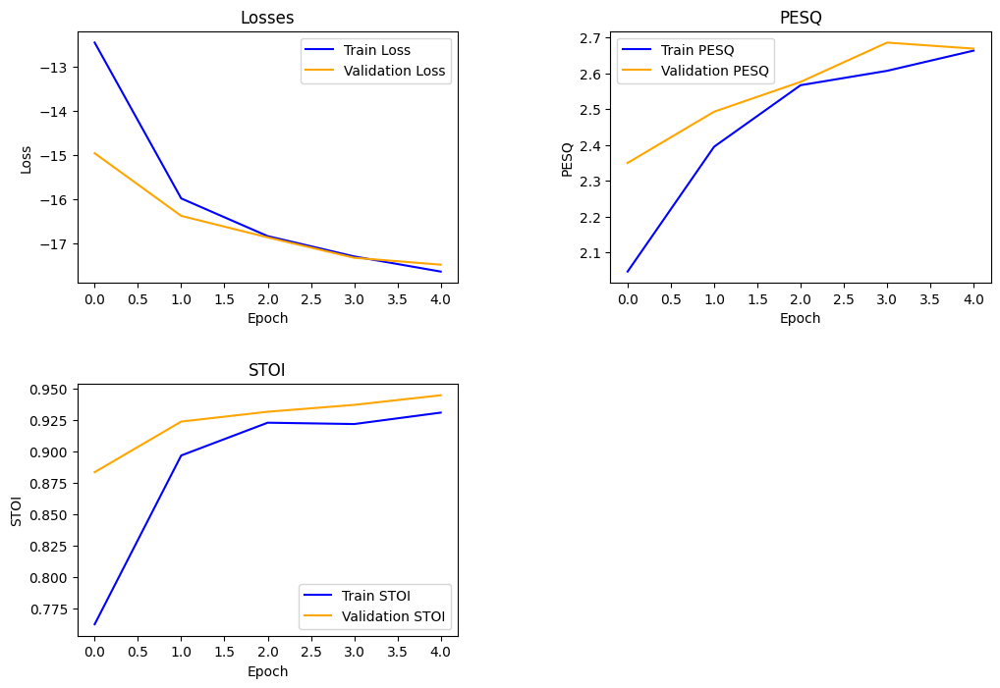

In [ ]:
plot_results(
    train_lossesTN,
    val_lossesTN,
    train_pesqsTN,
    val_pesqsTN,
    train_stoisTN,
    val_stoisTN
)

In [ ]:
# Create test dataset and dataloader
test_dataset = AudioDenoisingDataset(xtest_path, ytest_path, split=None)
test_loader = DataLoader(test_dataset, batch_size=6, shuffle=False)

In [ ]:
test_loss, test_pesq, test_stoi = test_model(model_TasNet, test_loader, device="cuda", criterion=si_snr_loss)

print(f"Test Results:")
print(f"Loss: {test_loss:.4f}")
print(f"PESQ: {test_pesq:.4f}")
print(f"STOI: {test_stoi:.4f}")

100%|██████████| 131/131 [08:54<00:00,  4.08s/it]

Test Results:
Loss: -17.9446
PESQ: 2.6483
STOI: 0.9345


In [ ]:
evaluate_and_display_audio(model_TasNet, test_loader, device="cuda", sample_rate=8000, num_examples=1)


Example 1:
Noisy Signal:


Denoised Signal:


Clean Signal:


In [ ]:
# Get one sample from the test set
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
noisy_sample, clean_sample = test_set[560]  # Select the desired test sample
noisy_sample = noisy_sample.unsqueeze(0).to(device)  # Add batch dimension

# Denoise the sample using the model
model_TasNet.eval()
with torch.no_grad():
    # Extract the first output (denoised signal) if the model returns a tuple
    denoised_sample = model_TasNet(noisy_sample)[0]  # Adjust this indexing as needed

# Convert to numpy for further processing
denoised_sample_np = denoised_sample.squeeze(0).cpu().numpy()  # Remove batch dimension
clean_sample_np = clean_sample.cpu().numpy()  # Convert clean signal to numpy
noisy_sample_np = noisy_sample.squeeze(0).cpu().numpy()  # Convert noisy signal to numpy


In [ ]:
noisy_sample_np = noisy_sample.cpu().squeeze().numpy()
clean_sample_np = clean_sample.cpu().squeeze().numpy()
# Check outputs
print(f"Noisy sample shape: {noisy_sample_np.shape}")
print(f"Clean sample shape: {clean_sample_np.shape}")
print(f"Denoised sample shape: {denoised_sample_np.shape}")

Noisy sample shape: (80000,)
Clean sample shape: (80000,)
Denoised sample shape: (80000,)


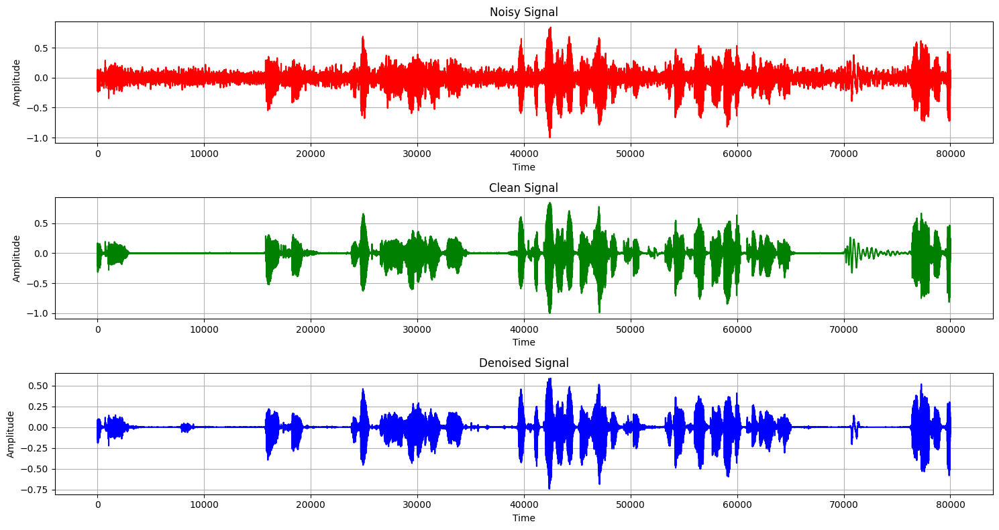

In [ ]:
plt.figure(figsize=(15, 8))

# Noisy Signal
plt.subplot(3, 1, 1)
plt.plot(noisy_sample_np, color='r')
plt.title('Noisy Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.grid(True)

# Clean Signal
plt.subplot(3, 1, 2)
plt.plot(clean_sample_np, color='g')
plt.title('Clean Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.grid(True)

# Denoised Signal
plt.subplot(3, 1, 3)
plt.plot(denoised_sample.cpu().squeeze().numpy(), color='b')  # Move to CPU and convert to NumPy
plt.title('Denoised Signal')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.grid(True)

plt.tight_layout()
plt.show()


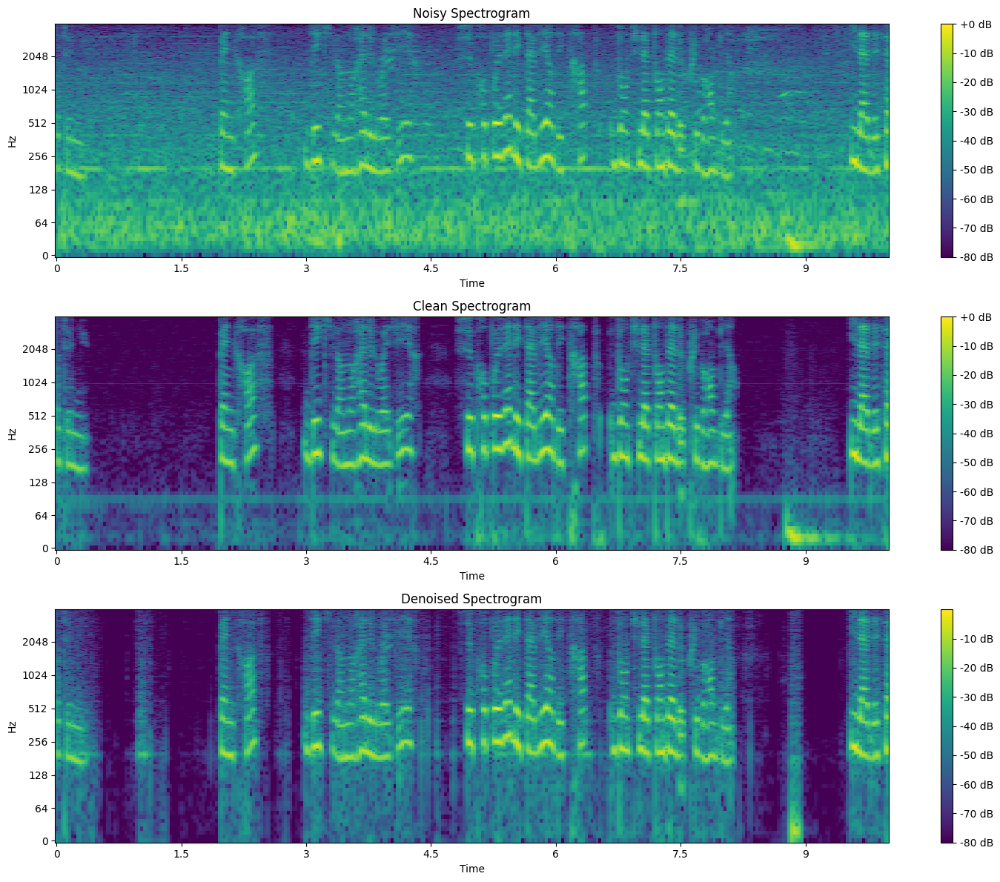

In [ ]:
# Plot spectrograms
plot_spectrograms(noisy_sample_np, clean_sample_np, denoised_sample_np, sample_rate=8000)


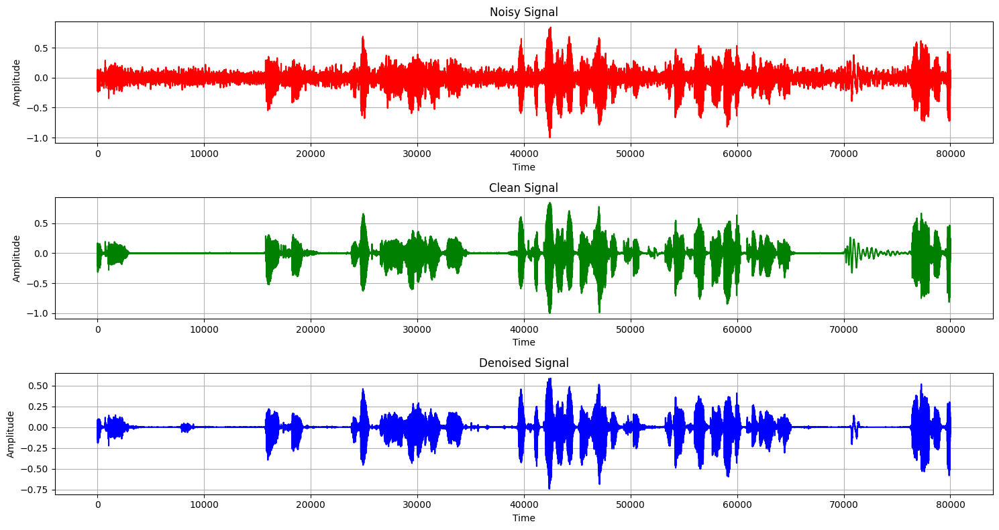

In [ ]:
plot_waveforms(noisy_sample_np, clean_sample_np, denoised_sample_np)

# Conv_Tsnet_Results

In [ ]:
from torch.utils.data import DataLoader

# Create datasets
train_dataset = AudioDenoisingDataset(xtrain_path, ytrain_path, split='train', p=0.8)
val_dataset = AudioDenoisingDataset(xtrain_path, ytrain_path, split='val', p=0.8)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=6, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=6, shuffle=False)

# Initialize model, optimizer, and criterion
model = ConvTasNet()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = si_snr_loss  # Use the SI-SNR loss function defined earlier

# Train the model
train_losses, val_losses, train_pesqs, val_pesqs, train_stois, val_stois, learning_rates = train(
    model,
    train_loader,
    val_loader,
    device="cuda",
    optimizer=optimizer,
    criterion=criterion,
    save_to="/content/drive/MyDrive/data/model.pth",
    num_epochs=5,
)


Model type: <class '__main__.ConvTasNet'>

Epoch 1/5


100%|██████████| 283/283 [05:24<00:00,  1.15s/it]


Validation


100%|██████████| 71/71 [01:05<00:00,  1.08it/s]


Epoch 1/5 - Train Loss: -13.4388, Val Loss: -16.2823 | Train PESQ: 2.3058, Val PESQ: 2.4274 | Train STOI: 0.7565, Val STOI: 0.8876 | Learning Rate: 0.010000

Epoch 2/5


100%|██████████| 283/283 [05:06<00:00,  1.08s/it]


Validation


100%|██████████| 71/71 [01:05<00:00,  1.08it/s]


Epoch 2/5 - Train Loss: -16.7614, Val Loss: -17.2635 | Train PESQ: 2.5310, Val PESQ: 2.5215 | Train STOI: 0.8993, Val STOI: 0.8920 | Learning Rate: 0.010000

Epoch 3/5


100%|██████████| 283/283 [05:06<00:00,  1.08s/it]


Validation


100%|██████████| 71/71 [01:05<00:00,  1.08it/s]


Epoch 3/5 - Train Loss: -17.5188, Val Loss: -17.9049 | Train PESQ: 2.6090, Val PESQ: 2.6487 | Train STOI: 0.9171, Val STOI: 0.9241 | Learning Rate: 0.010000

Epoch 4/5


100%|██████████| 283/283 [05:06<00:00,  1.08s/it]


Validation


100%|██████████| 71/71 [01:05<00:00,  1.08it/s]


Epoch 4/5 - Train Loss: -17.9604, Val Loss: -18.3440 | Train PESQ: 2.7100, Val PESQ: 2.7071 | Train STOI: 0.9280, Val STOI: 0.9320 | Learning Rate: 0.010000

Epoch 5/5


100%|██████████| 283/283 [05:07<00:00,  1.09s/it]


Validation


100%|██████████| 71/71 [01:06<00:00,  1.07it/s]

Epoch 5/5 - Train Loss: -18.3649, Val Loss: -18.5437 | Train PESQ: 2.8175, Val PESQ: 2.7693 | Train STOI: 0.9402, Val STOI: 0.9224 | Learning Rate: 0.010000
Model saved successfully.


In [ ]:
print("Train Losses:", train_losses)
print("Val Losses:", val_losses)
print("Train PESQs:", train_pesqs)
print("Val PESQs:", val_pesqs)
print("Train STOIs:", train_stois)
print("Val STOIs:", val_stois)
print("Learning Rates:", learning_rates)

Train Losses: [-13.438810286240475, -16.761405907755606, -17.51880968922861, -17.960408712865608, -18.3649355345817]
Val Losses: [-16.28230202365929, -17.26352570762097, -17.90494616602508, -18.344023261271733, -18.543688008483027]
Train PESQs: [2.305816218204296, 2.5310482544949533, 2.6089817668860875, 2.7099766941879326, 2.81746212332493]
Val PESQs: [2.427433064286138, 2.521542253628583, 2.6486577483969675, 2.7070757436080717, 2.7692798476823617]
Train STOIs: [0.7564883640583346, 0.8993235923309281, 0.9171113797941596, 0.9280430088826288, 0.9402180667918145]
Val STOIs: [0.887648722788675, 0.8920391087727293, 0.9240899250531567, 0.9320286749894131, 0.9223820254177725]
Learning Rates: [4.000000000000001e-06, 1.6000000000000003e-05, 3.6e-05, 6.400000000000001e-05, 0.00010000000000000002, 0.000144, 0.00019600000000000002, 0.00025600000000000004, 0.000324, 0.0004000000000000001, 0.000484, 0.000576, 0.0006760000000000001, 0.0007840000000000001, 0.0009, 0.0010240000000000002, 0.001156000000

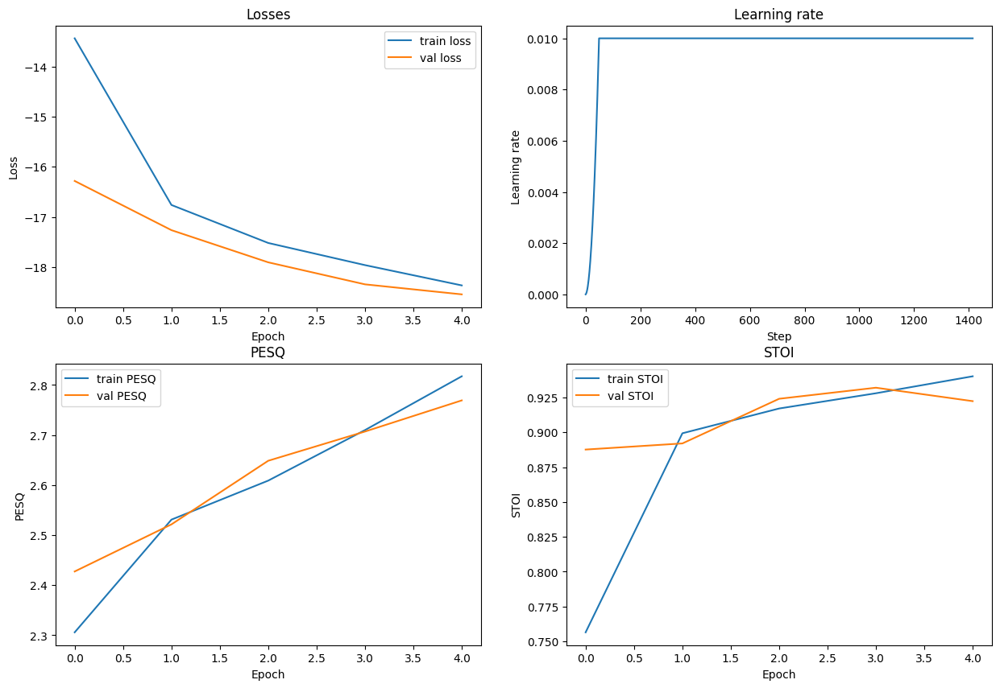

In [ ]:
plot_results(
    train_losses,
    val_losses,
    train_pesqs,
    val_pesqs,
    train_stois,
    val_stois,
    learning_rates
)


In [ ]:
# Create test dataset and dataloader
test_dataset = AudioDenoisingDataset(xtest_path, ytest_path, split=None)
test_loader = DataLoader(test_dataset, batch_size=6, shuffle=False)


In [ ]:
test_loss, test_pesq, test_stoi = test_model(modelconv_tasnet, test_loader, device="cuda", criterion=si_snr_loss)

print(f"Test Results:")
print(f"Loss: {test_loss:.4f}")
print(f"PESQ: {test_pesq:.4f}")
print(f"STOI: {test_stoi:.4f}")


100%|██████████| 131/131 [12:06<00:00,  5.55s/it]

Test Results:
Loss: -18.9411
PESQ: 2.8430
STOI: 0.9359


In [ ]:
model_covTasNet = ConvTasNet()
# Load the model weights
model_covTasNet.load_state_dict(torch.load('/content/drive/MyDrive/data/Cov_Tasnet.pth'))

# Set the model to evaluation mode and move it to the device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_covTasNet = model_covTasNet.to(device)
model_covTasNet.eval()

<ipython-input-132-1e01aefed997>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_covTasNet.load_state_dict(torch.load('/content/drive/MyDrive/data/Cov_Tasnet.pth'))


ConvTasNet(
  (encoder): Conv1D(1, 512, kernel_size=(16,), stride=(8,))
  (LayerN_S): CumulativeLayerNorm((512,), eps=1e-05, elementwise_affine=True)
  (BottleN_S): Conv1D(512, 128, kernel_size=(1,), stride=(1,))
  (separation): Sequential(
    (0): Sequential(
      (0): Conv1D_Block(
        (conv1x1): Conv1D(128, 512, kernel_size=(1,), stride=(1,))
        (PReLU_1): PReLU(num_parameters=1)
        (norm_1): GlobalLayerNorm()
        (dwconv): Conv1D(512, 512, kernel_size=(3,), stride=(1,), padding=(1,), groups=512)
        (PReLU_2): PReLU(num_parameters=1)
        (norm_2): GlobalLayerNorm()
        (Sc_conv): Conv1d(512, 128, kernel_size=(1,), stride=(1,))
      )
      (1): Conv1D_Block(
        (conv1x1): Conv1D(128, 512, kernel_size=(1,), stride=(1,))
        (PReLU_1): PReLU(num_parameters=1)
        (norm_1): GlobalLayerNorm()
        (dwconv): Conv1D(512, 512, kernel_size=(3,), stride=(1,), padding=(2,), dilation=(2,), groups=512)
        (PReLU_2): PReLU(num_parameters=1)


In [ ]:
# Get one sample from your test set (replace 'test_set' with your dataset)
noisy_sample, clean_sample = test_set[560]  # Example index
noisy_sample = noisy_sample.unsqueeze(0).to(device)  # Add batch dimension
clean_sample = clean_sample.squeeze().cpu().numpy()  # Convert to NumPy for plotting

<class 'list'>
2


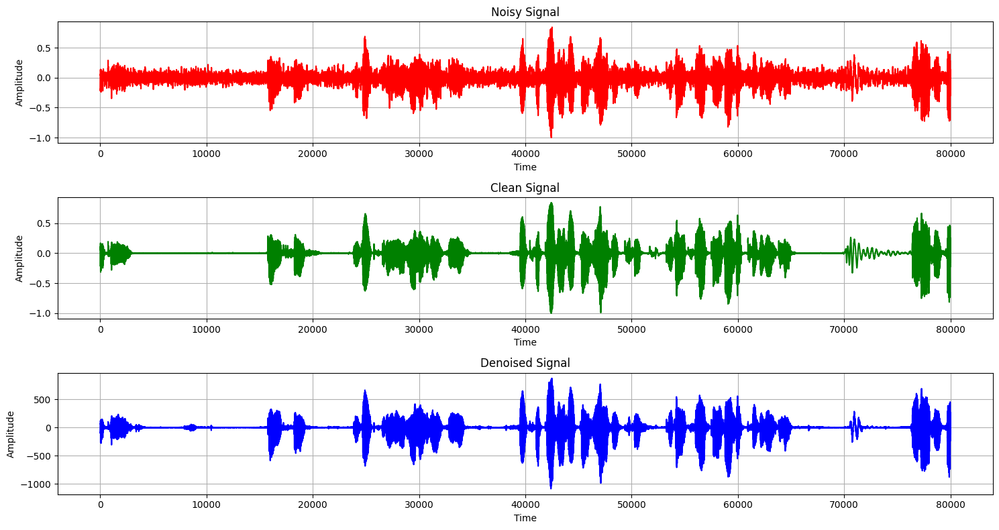

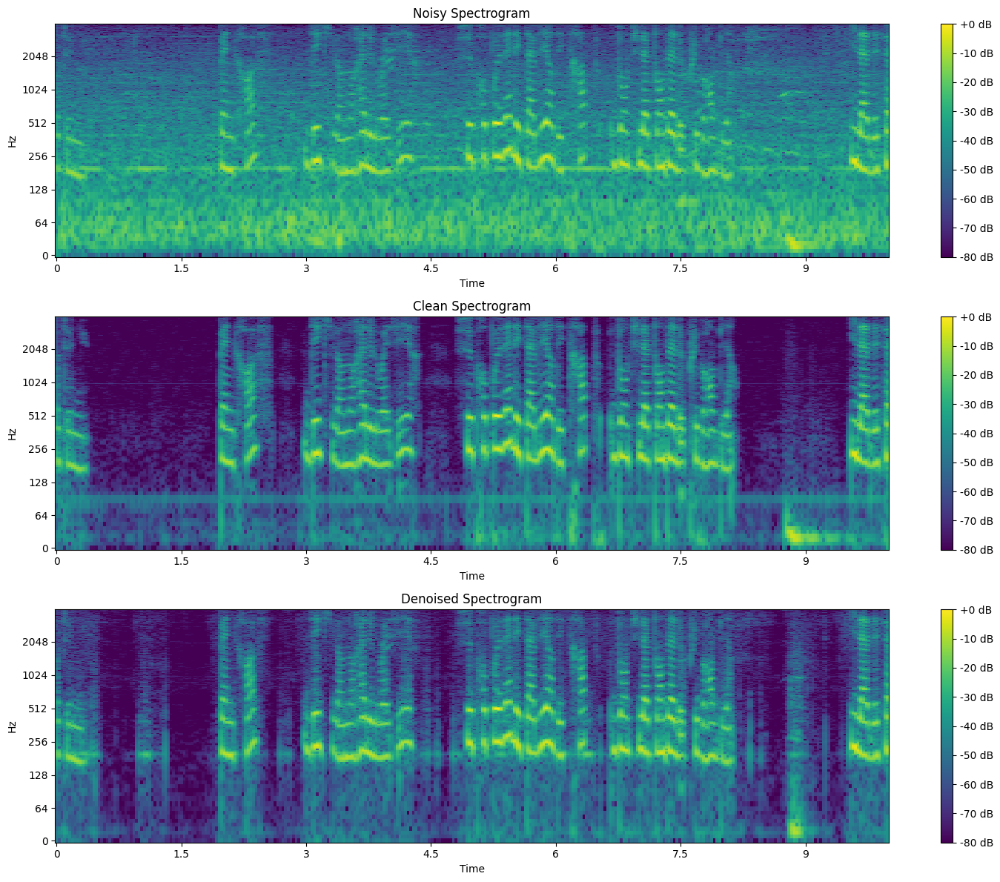

In [ ]:
# Ensure tensors are on the correct device
noisy_sample = noisy_sample.to(device)

# Evaluate model and get denoised sample
with torch.no_grad():
    output = model_covTasNet(noisy_sample)
    print(type(output))  # Check output type
    print(len(output))   # Check output size if it's a list or tuple

    denoised_sample = output[0]  # Adjust indexing based on the model's output
    denoised_sample = denoised_sample.squeeze(0).cpu().numpy()  # Convert to NumPy

# Convert clean_sample to NumPy
clean_sample = clean_sample.to(device)

# Proceed with plotting or further processing
plot_waveforms(noisy_sample.cpu().squeeze().numpy(), clean_sample.cpu().squeeze().numpy(), denoised_sample)
plot_spectrograms(noisy_sample.cpu().squeeze().numpy(), clean_sample.cpu().squeeze().numpy(), denoised_sample, sample_rate=8000)


In [ ]:
def evaluate_and_play_audio(model, test_set, sample_index, device, sample_rate=8000):
    """
    Evaluate the model on a specific sample and play the audio signals.

    Args:
        model: The trained model.
        test_set: The dataset (e.g., test set) containing noisy and clean signals.
        sample_index: The index of the sample to evaluate and play.
        device: Device to run the model on ('cuda' or 'cpu').
        sample_rate: Audio sample rate for playback.
    """
    # Load the specific sample
    noisy_sample, clean_sample = test_set[sample_index]

    # Move noisy_sample to device
    noisy_sample = noisy_sample.to(device)
    if noisy_sample.dim() == 1:
        noisy_sample = noisy_sample.unsqueeze(0)  # Add batch dimension if necessary

    # Pass through the model
    model.eval()
    with torch.no_grad():
        output = model(noisy_sample)  # Pass noisy sample through the model
        if isinstance(output, list):  # If the model returns a list, get the first element
            denoised_sample = output[0]
        else:
            denoised_sample = output
        denoised_sample = denoised_sample.cpu().squeeze().numpy()  # Convert to NumPy

    # Convert to numpy for clean and noisy samples
    noisy_sample_np = noisy_sample.cpu().squeeze().numpy()
    clean_sample_np = clean_sample.cpu().squeeze().numpy()

    # Play audio
    print("Noisy Signal:")
    display(Audio(noisy_sample_np, rate=sample_rate))

    print("Clean Signal:")
    display(Audio(clean_sample_np, rate=sample_rate))

    print("Denoised Signal:")
    display(Audio(denoised_sample, rate=sample_rate))

# Example usage
evaluate_and_play_audio(model_covTasNet, test_set, sample_index=560, device="cuda", sample_rate=8000)


Noisy Signal:


Clean Signal:


Denoised Signal:


# Table of results

<table style="width:100%; font-size:20px; text-align:center; border:1px solid black; border-collapse:collapse;">
  <tr style="background-color:#f2f2f2;">
    <th style="padding:10px; border:1px solid black;">Model</th>
    <th style="padding:10px; border:1px solid black;">PESQ (↑)</th>
    <th style="padding:10px; border:1px solid black;">STOI (↑)</th>
  </tr>
  <tr>
    <td style="padding:10px; border:1px solid black;">Wiener Filter</td>
    <td style="padding:10px; border:1px solid black;">2.18</td>
    <td style="padding:10px; border:1px solid black;">0.86</td>
  </tr>
  <tr>
    <td style="padding:10px; border:1px solid black;">Butterworth Filter</td>
    <td style="padding:10px; border:1px solid black;">2.49</td>
    <td style="padding:10px; border:1px solid black; color:green;"><b>0.95</b></td>
  </tr>
  <tr>
    <td style="padding:10px; border:1px solid black;">Spectrogram U-Net</td>
    <td style="padding:10px; border:1px solid black; color:green;"><b>3.39</b></td>
    <td style="padding:10px; border:1px solid black;">0.91</td>
  </tr>
  <tr>
    <td style="padding:10px; border:1px solid black;">WaveNet</td>
    <td style="padding:10px; border:1px solid black;">3.16</td>
    <td style="padding:10px; border:1px solid black;">0.94</td>
  </tr>
  <tr>
    <td style="padding:10px; border:1px solid black;">TasNet</td>
    <td style="padding:10px; border:1px solid black;">2.65</td>
    <td style="padding:10px; border:1px solid black;">0.93</td>
  </tr>
  <tr>
    <td style="padding:10px; border:1px solid black;">ConvTasNet</td>
    <td style="padding:10px; border:1px solid black;">2.84</td>
    <td style="padding:10px; border:1px solid black;">0.94</td>
  </tr>
</table>
